# Risk analytics in banking and financial services - Case Study

## Business Objectives
This case study aims to identify patterns which indicate if a client has difficulty paying their instalments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA is the aim of this case study.

## Step:1 Data Sourcing

#### Importing the libraries.

In [225]:
#import the warnings.
import warnings
warnings.filterwarnings("ignore")

In [226]:
#import the useful libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [227]:
#read the data set of "previous_application" in pre_app.
pre_app = pd.read_csv("previous_application.csv")

In [228]:
#read the data set of "application_data" in app_data.
app_data = pd.read_csv("application_data.csv")

In [229]:
#read the data set of "columns_description" in df.
df = pd.read_csv(r"C:\Users\irahu\OneDrive\Desktop\Recored\Data science\05. EDA\06. credit EDA case study\Dataset\columns_description.csv",encoding='cp1252',index_col = "Row")
df.drop(["Special","Unnamed: 0"],axis=1,inplace=True)

In [230]:
# setting the max row & columns display to 130
pd.set_option("display.max_columns",130)
pd.set_option("display.max_rows",130)

In [231]:
# using loc to see the description of columns name
df.loc["TARGET"][1]

'Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)'

#### Print the head of the data frames.

In [232]:
pre_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [233]:
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [234]:
#checking the shape and data types of the data frame.
app_data.shape

(307511, 122)

In [235]:
pre_app.shape

(1670214, 37)

In [236]:
app_data.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [237]:
pre_app.dtypes

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

In [238]:
#using describe to see the statistical description of the numerical columns
app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [239]:
pre_app.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


# Step-2 Data cleaning

In [240]:
#checking data types

In [241]:
app_data.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


In [242]:
df.loc["AMT_REQ_CREDIT_BUREAU_YEAR"]

Table                                           application_data
Description    Number of enquiries to Credit Bureau about the...
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: object

### All the data types are found to be satisfactory. forwarding to the next step of data cleaning: Missing Values

In [243]:
#data cleaning in the app_data - finding the % of missing values
(app_data.isnull().sum()/app_data.shape[0])*100

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE               0.000000
CODE_GENDER                      0.000000
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT                       0.000000
AMT_ANNUITY                      0.003902
AMT_GOODS_PRICE                  0.090403
NAME_TYPE_SUITE                  0.420148
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
OWN_CAR_AGE                     65.990810
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0

In [244]:
# dropping all the columns having missing value more than 40%
app_data= app_data.loc[:, app_data.isnull().sum()/app_data.shape[0]*100 <= 40]

In [245]:
app_data.shape
#after the first cleaing operation only 73 rows out of 122 row remains.

(307511, 73)

In [246]:
(app_data.isnull().sum()/app_data.shape[0]*100)

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE

In [247]:
#sorting by descending values
(app_data.isnull().sum()/app_data.shape[0]*100).sort_values(ascending=False)
# OCCUPATION_TYPE , EXT_SOURCE_3 , AMT_REQ_CREDIT_BUREAU_YEAR seems to be important w.r.t target variable

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
AMT_REQ_CREDIT_BUREAU_WEEK     13.501631
AMT_REQ_CREDIT_BUREAU_DAY      13.501631
AMT_REQ_CREDIT_BUREAU_HOUR     13.501631
NAME_TYPE_SUITE                 0.420148
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
EXT_SOURCE_2                    0.214626
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
FLAG_DOCUMENT_17                0.000000
FLAG_DOCUMENT_18                0.000000
FLAG_DOCUMENT_21                0.000000
FLAG_DOCUMENT_20                0.000000
FLAG_DOCUMENT_19                0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3 

In [248]:
#Dropping the irrelevant columns
app_data.drop(["AMT_REQ_CREDIT_BUREAU_HOUR","AMT_REQ_CREDIT_BUREAU_DAY","AMT_REQ_CREDIT_BUREAU_WEEK","AMT_REQ_CREDIT_BUREAU_MON","AMT_REQ_CREDIT_BUREAU_QRT"], axis=1, inplace=True)

In [249]:
(app_data.isnull().sum()/app_data.shape[0]*100).sort_values(ascending=False)

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
NAME_TYPE_SUITE                 0.420148
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
EXT_SOURCE_2                    0.214626
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
FLAG_DOCUMENT_6                 0.000000
ORGANIZATION_TYPE               0.000000
FLAG_DOCUMENT_2                 0.000000
FLAG_DOCUMENT_3                 0.000000
FLAG_DOCUMENT_4                 0.000000
FLAG_DOCUMENT_5                 0.000000
FLAG_DOCUMENT_8                 0.000000
FLAG_DOCUMENT_7                 0.000000
REG_CITY_NOT_WORK_CITY          0.000000
FLAG_DOCUMENT_9                 0.000000
FLAG_DOCUMENT_10                0.000000
FLAG_DOCUMENT_11

In [250]:
# droping the rows having less than 1% missing values
app_data.dropna(subset=["NAME_TYPE_SUITE","OBS_30_CNT_SOCIAL_CIRCLE","OBS_60_CNT_SOCIAL_CIRCLE","DEF_60_CNT_SOCIAL_CIRCLE","EXT_SOURCE_2","AMT_GOODS_PRICE","AMT_ANNUITY","CNT_FAM_MEMBERS","DAYS_LAST_PHONE_CHANGE"], inplace=True)

In [251]:
(app_data.isnull().sum()/app_data.shape[0]*100).sort_values(ascending=False)
#most of the missing values has been handled others will be imputed.

OCCUPATION_TYPE                31.338353
EXT_SOURCE_3                   19.784849
AMT_REQ_CREDIT_BUREAU_YEAR     13.498790
OBS_60_CNT_SOCIAL_CIRCLE        0.000000
FLAG_DOCUMENT_4                 0.000000
FLAG_DOCUMENT_3                 0.000000
FLAG_DOCUMENT_2                 0.000000
DAYS_LAST_PHONE_CHANGE          0.000000
DEF_60_CNT_SOCIAL_CIRCLE        0.000000
OBS_30_CNT_SOCIAL_CIRCLE        0.000000
DEF_30_CNT_SOCIAL_CIRCLE        0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
EXT_SOURCE_2                    0.000000
ORGANIZATION_TYPE               0.000000
LIVE_CITY_NOT_WORK_CITY         0.000000
REG_CITY_NOT_WORK_CITY          0.000000
FLAG_DOCUMENT_5                 0.000000
FLAG_DOCUMENT_6                 0.000000
FLAG_DOCUMENT_7                 0.000000
FLAG_DOCUMENT_8                 0.000000
FLAG_DOCUMENT_9                 0.000000
FLAG_DOCUMENT_10                0.000000
FLAG_DOCUMENT_11                0.000000
FLAG_DOCUMENT_12                0.000000
FLAG_DOCUMENT_13

### Imputing the missing data

In [252]:
app_data["OCCUPATION_TYPE"].value_counts()

Laborers                 54730
Sales staff              31790
Core staff               27263
Managers                 21114
Drivers                  18456
High skill tech staff    11261
Accountants               9698
Medicine staff            8459
Security staff            6667
Cooking staff             5898
Cleaning staff            4615
Private service staff     2629
Low-skill Laborers        2077
Waiters/barmen staff      1335
Secretaries               1293
Realty agents              742
HR staff                   558
IT staff                   511
Name: OCCUPATION_TYPE, dtype: int64

In [253]:
#imputing the missing values with "Missing" for "OCCUPATION_TYPE"
app_data["OCCUPATION_TYPE"] = app_data["OCCUPATION_TYPE"].fillna("Missing")
app_data["OCCUPATION_TYPE"].value_counts()

Missing                  95435
Laborers                 54730
Sales staff              31790
Core staff               27263
Managers                 21114
Drivers                  18456
High skill tech staff    11261
Accountants               9698
Medicine staff            8459
Security staff            6667
Cooking staff             5898
Cleaning staff            4615
Private service staff     2629
Low-skill Laborers        2077
Waiters/barmen staff      1335
Secretaries               1293
Realty agents              742
HR staff                   558
IT staff                   511
Name: OCCUPATION_TYPE, dtype: int64

In [254]:
df.loc["EXT_SOURCE_3"]

Table                                    application_data
Description    Normalized score from external data source
Name: EXT_SOURCE_3, dtype: object

In [255]:
app_data["EXT_SOURCE_3"].describe()

count    244280.000000
mean          0.510764
std           0.194843
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

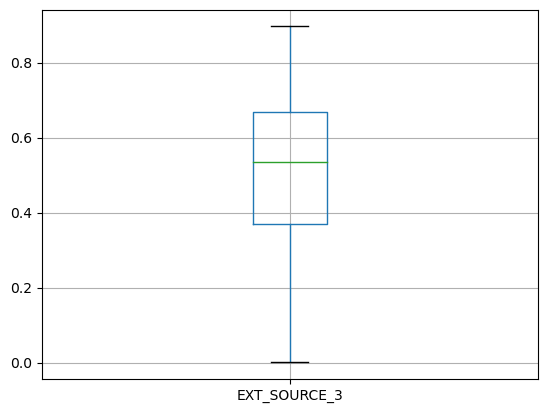

In [256]:
app_data.boxplot(column=['EXT_SOURCE_3'])
plt.show()

In [257]:
#As shown in the above box plot we have found no outliers in the data. so we can impute the missing values as the mean.
EXT_SOURCE_3_mean = app_data["EXT_SOURCE_3"].mean()

In [258]:
app_data["EXT_SOURCE_3"] = app_data["EXT_SOURCE_3"].fillna(EXT_SOURCE_3_mean)
app_data["EXT_SOURCE_3"].value_counts()

0.510764    60251
0.746300     1442
0.713631     1297
0.694093     1266
0.670652     1179
            ...  
0.864212        1
0.019468        1
0.020311        1
0.872456        1
0.043227        1
Name: EXT_SOURCE_3, Length: 815, dtype: int64

In [259]:
df.loc["AMT_REQ_CREDIT_BUREAU_YEAR"][1]

'Number of enquiries to Credit Bureau about the client one day year (excluding last 3 months before application)'

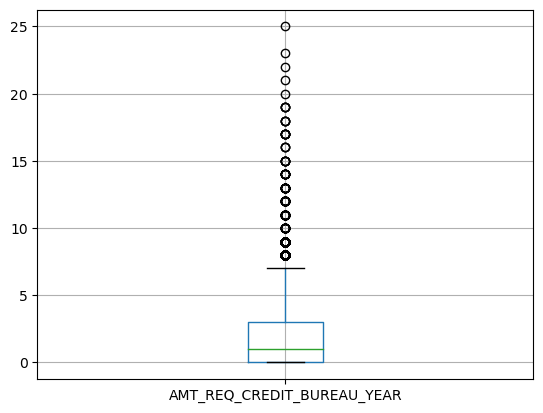

In [260]:
#lets check for outliers through boxplot in AMT_REQ_CREDIT_BUREAU_YEAR 
app_data.boxplot(column=['AMT_REQ_CREDIT_BUREAU_YEAR'])
plt.show()

In [261]:
app_data["AMT_REQ_CREDIT_BUREAU_YEAR"].quantile([0.5,0.75,0.95,0.99])

0.50    1.0
0.75    3.0
0.95    6.0
0.99    8.0
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: float64

In [262]:
# as shown above the data is having potential outliers value above upper fence.
# but those are not actual outliers as per the column defination, so we can replace the missing value with median.
app_data["AMT_REQ_CREDIT_BUREAU_YEAR"].fillna(app_data["AMT_REQ_CREDIT_BUREAU_YEAR"].median(),inplace=True)

In [263]:
#final check in the dataset for missing values.
app_data.isnull().sum()

SK_ID_CURR                     0
TARGET                         0
NAME_CONTRACT_TYPE             0
CODE_GENDER                    0
FLAG_OWN_CAR                   0
FLAG_OWN_REALTY                0
CNT_CHILDREN                   0
AMT_INCOME_TOTAL               0
AMT_CREDIT                     0
AMT_ANNUITY                    0
AMT_GOODS_PRICE                0
NAME_TYPE_SUITE                0
NAME_INCOME_TYPE               0
NAME_EDUCATION_TYPE            0
NAME_FAMILY_STATUS             0
NAME_HOUSING_TYPE              0
REGION_POPULATION_RELATIVE     0
DAYS_BIRTH                     0
DAYS_EMPLOYED                  0
DAYS_REGISTRATION              0
DAYS_ID_PUBLISH                0
FLAG_MOBIL                     0
FLAG_EMP_PHONE                 0
FLAG_WORK_PHONE                0
FLAG_CONT_MOBILE               0
FLAG_PHONE                     0
FLAG_EMAIL                     0
OCCUPATION_TYPE                0
CNT_FAM_MEMBERS                0
REGION_RATING_CLIENT           0
REGION_RAT

### Handling outliers value

In [264]:
app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR
count,304531.000000,304531.000000,304531.000000,3.045310e+05,3.045310e+05,304531.000000,3.045310e+05,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.0,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,3.045310e+05,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000
mean,278171.558800,0.081000,0.417140,1.686634e+05,5.995592e+05,27146.369655,5.384949e+05,0.020842,-16040.509915,63831.232423,-4986.687785,-2994.732070,1.0,0.819841,0.199730,0.998141,0.281278,0.056881,2.153163,2.053328,2.032302,12.060079,0.015154,0.050675,0.040518,0.078212,0.230630,0.179709,5.142203e-01,0.510764,1.422052,0.143421,1.405131,0.100069,-965.330085,0.000043,0.712860,0.000082,0.014708,0.088067,0.000138,0.081670,0.003852,0.000020,0.003845,0.000007,0.003425,0.002821,0.001133,0.009447,0.000263,0.007851,0.000575,0.000496,0.000328,1.783618
std,102782.532925,0.272836,0.722308,2.378910e+05,4.021453e+05,14480.104699,3.690524e+05,0.013808,4361.978717,141291.148422,3521.601095,1509.373915,0.0,0.384320,0.399798,0.043071,0.449624,0.231615,0.910638,0.508890,0.502616,3.265884,0.122167,0.219333,0.197171,0.268505,0.421237,0.383946,1.911246e-01,0.174507,2.401424,0.446721,2.380308,0.362388,826.943447,0.006534,0.452428,0.009060,0.120381,0.283392,0.011743,0.273862,0.061944,0.004439,0.061891,0.002563,0.058423,0.053036,0.033639,0.096737,0.016206,0.088260,0.023965,0.022262,0.018118,1.766221
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189138.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16573.500000,2.385000e+05,0.010006,-19682.000000,-2762.000000,-7478.000000,-4299.000000,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.921081e-01,0.417100,0.000000,0.000000,0.000000,0.000000,-1572.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,278193.000000,0.0

In [265]:
app_data.describe(percentiles= [0.99]) #checking the 0.99 persentile

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR
count,304531.000000,304531.000000,304531.000000,3.045310e+05,3.045310e+05,304531.000000,3.045310e+05,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.0,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,3.045310e+05,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000
mean,278171.558800,0.081000,0.417140,1.686634e+05,5.995592e+05,27146.369655,5.384949e+05,0.020842,-16040.509915,63831.232423,-4986.687785,-2994.732070,1.0,0.819841,0.199730,0.998141,0.281278,0.056881,2.153163,2.053328,2.032302,12.060079,0.015154,0.050675,0.040518,0.078212,0.230630,0.179709,5.142203e-01,0.510764,1.422052,0.143421,1.405131,0.100069,-965.330085,0.000043,0.712860,0.000082,0.014708,0.088067,0.000138,0.081670,0.003852,0.000020,0.003845,0.000007,0.003425,0.002821,0.001133,0.009447,0.000263,0.007851,0.000575,0.000496,0.000328,1.783618
std,102782.532925,0.272836,0.722308,2.378910e+05,4.021453e+05,14480.104699,3.690524e+05,0.013808,4361.978717,141291.148422,3521.601095,1509.373915,0.0,0.384320,0.399798,0.043071,0.449624,0.231615,0.910638,0.508890,0.502616,3.265884,0.122167,0.219333,0.197171,0.268505,0.421237,0.383946,1.911246e-01,0.174507,2.401424,0.446721,2.380308,0.362388,826.943447,0.006534,0.452428,0.009060,0.120381,0.283392,0.011743,0.273862,0.061944,0.004439,0.061891,0.002563,0.058423,0.053036,0.033639,0.096737,0.016206,0.088260,0.023965,0.022262,0.018118,1.766221
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278193.000000,0.000000,0.000000,1.476000e+05,5.172660e+05,24939.000000,4.500000e+05,0.018850,-15755.000000,-1215.000000,-4505.000000,-3255.000000,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.658110e-01,0.510764,0.000000,0.000000,0.000000,0.000000,-761.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
99%,452699.700000,1.00

In [266]:
# from the above descrition of the data set we can see that the value of the 99% persentile and max value have huge differnce
# for CNT_CHILDREN,AMT_INCOME_TOTAL, AMT_CREDIT , AMT_ANNUITY , AMT_GOODS_PRICE, CNT_FAM_MEMBERS ,OBS_60_CNT_SOCIAL_CIRCLE.
# checking the potential outilers with box plot.

In [267]:
df.loc["CNT_CHILDREN"]

Table                           application_data
Description    Number of children the client has
Name: CNT_CHILDREN, dtype: object

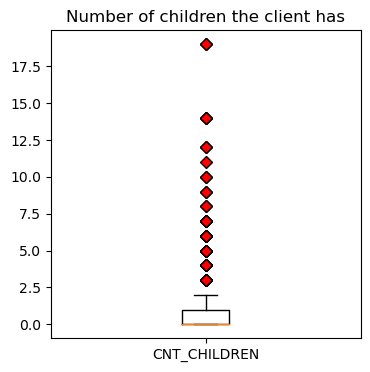

In [268]:
plt.figure(figsize=[4,4])
data = app_data[['CNT_CHILDREN']]

# create outlier point shape
red_diamond = dict(markerfacecolor='r', marker='D')

# set title
plt.title('Number of children the client has')

# make the boxplot
plt.boxplot(data.values, labels=['CNT_CHILDREN'], flierprops=red_diamond);

In [269]:
def cat_cnt(x):
    if x==0:
        return("0")
    elif x==1:
        return("1")
    elif x==2:
        return("2")
    elif x==3:
        return("3")
    else:
        return("4+")

In [270]:
#Binning the outliers
app_data["GRP_CNT_CHILDREN"] = app_data["CNT_CHILDREN"].apply(cat_cnt)

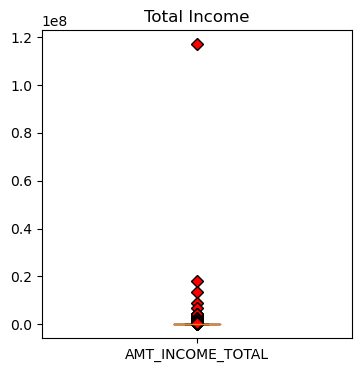

In [271]:
plt.figure(figsize=[4,4])
data = app_data[['AMT_INCOME_TOTAL']]

# create outlier point shape
red_diamond = dict(markerfacecolor='r', marker='D')

# set title
plt.title('Total Income')

# make the boxplot
plt.boxplot(data.values, labels=['AMT_INCOME_TOTAL'], flierprops=red_diamond);

In [272]:
# the box plot shows potential outliers in the AMT_INCOME_TOTAL. It can be handeled using binning of values.
app_data['GRP_INCOME'] = pd.cut(app_data['AMT_INCOME_TOTAL'] , bins = (0,100000,200000,300000,450000), labels = ["Low","Medium","High","Very High"])

In [273]:
app_data['GRP_INCOME'].value_counts()

Medium       154508
High          64566
Low           63051
Very High     19355
Name: GRP_INCOME, dtype: int64

In [274]:
app_data['GRP_INCOME'].isnull().sum()

3051

In [275]:
app_data['GRP_INCOME'].value_counts()

Medium       154508
High          64566
Low           63051
Very High     19355
Name: GRP_INCOME, dtype: int64

In [276]:
app_data.shape

(304531, 70)

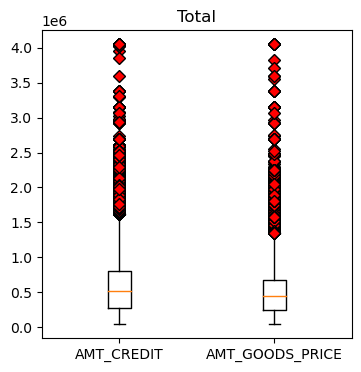

In [277]:
plt.figure(figsize=[4,4])
data = app_data[['AMT_CREDIT', "AMT_GOODS_PRICE"]]

# create outlier point shape
red_diamond = dict(markerfacecolor='r', marker='D')

# set title
plt.title('Total')

# make the boxplot
plt.boxplot(data.values, labels=['AMT_CREDIT', "AMT_GOODS_PRICE"], flierprops=red_diamond);

In [278]:
#The potential outliers in AMT_CREDIT & AMT_GOODS_PRICE seems to be normal in the financial data sets as high price of the goods
#for which the loan is given will leads to high credit amount. It can be handeled using binning of values.
app_data['GRP_AMT_CREDIT'] = pd.cut(app_data['AMT_CREDIT'] , bins = (0,270000,520000,800000,1000000), labels = ["Low","Medium","High","Very High"])
app_data['GRP_AMT_GOODS_PRICE'] = pd.cut(app_data['AMT_GOODS_PRICE'] , bins = (0,240000,450000,700000,1000000), labels = ["Low","Medium","High","Very High"])

In [279]:
app_data['GRP_AMT_CREDIT'].value_counts()

Low          77330
Medium       76114
High         71000
Very High    30497
Name: GRP_AMT_CREDIT, dtype: int64

In [280]:
app_data['GRP_AMT_GOODS_PRICE'].value_counts()

Low          79152
Medium       77251
High         77222
Very High    37100
Name: GRP_AMT_GOODS_PRICE, dtype: int64

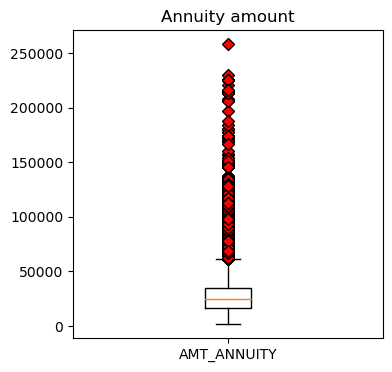

In [281]:
plt.figure(figsize=[4,4])
data = app_data[['AMT_ANNUITY']]

# create outlier point shape
red_diamond = dict(markerfacecolor='r', marker='D')

# set title
plt.title('Annuity amount')

# make the boxplot
plt.boxplot(data.values, labels=['AMT_ANNUITY'], flierprops=red_diamond);

In [282]:
app_data['AMT_ANNUITY'].describe(percentiles= [0.25, 0.75, 0.9 , 0.99])

count    304531.000000
mean      27146.369655
std       14480.104699
min        1615.500000
25%       16573.500000
50%       24939.000000
75%       34641.000000
90%       45954.000000
99%       70015.500000
max      258025.500000
Name: AMT_ANNUITY, dtype: float64

In [283]:
# the box plot shows potential outliers in the AMT_INCOME_TOTAL. It can be handeled using binning of values.
app_data['GRP_AMT_ANNUITY'] = pd.cut(app_data['AMT_ANNUITY'] , bins = (0,5000,10000,25000,50000,75000), labels = ["<5000","5001-10000","10001-25000","25001-50000","50001-75000"])

In [284]:
app_data['GRP_AMT_ANNUITY'].value_counts()

25001-50000    130556
10001-25000    130043
5001-10000      21708
50001-75000     19125
<5000            1135
Name: GRP_AMT_ANNUITY, dtype: int64

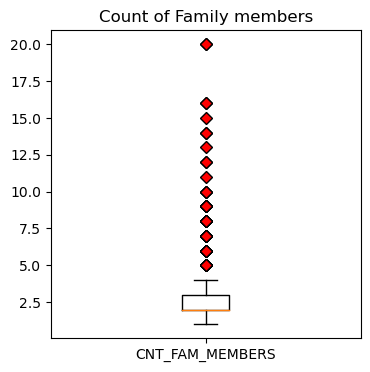

In [285]:
plt.figure(figsize=[4,4])
data = app_data[['CNT_FAM_MEMBERS']]

# create outlier point shape
red_diamond = dict(markerfacecolor='r', marker='D')

# set title
plt.title('Count of Family members')

# make the boxplot
plt.boxplot(data.values, labels=["CNT_FAM_MEMBERS"], flierprops=red_diamond);

In [286]:
def cat_cnt_1(x):
    if x==0:
        return("0")
    elif x==1:
        return("1")
    elif x==2:
        return("2")
    elif x==3:
        return("3")
    elif x==4:
        return("4")
    else:
        return("5+")

In [287]:
# CNT_FAM_MEMBERS can be binned for better data understanding.
#Binning the outliers
app_data["GRP_CNT_FAM_MEMBERS"] = app_data["CNT_FAM_MEMBERS"].apply(cat_cnt_1)

In [288]:
app_data["GRP_CNT_FAM_MEMBERS"].value_counts()

2     156909
1      67083
3      52096
4      24474
5+      3969
Name: GRP_CNT_FAM_MEMBERS, dtype: int64

In [289]:
app_data["CNT_FAM_MEMBERS"].value_counts()

2.0     156909
1.0      67083
3.0      52096
4.0      24474
5.0       3442
6.0        406
7.0         81
8.0         20
9.0          6
10.0         3
14.0         2
12.0         2
20.0         2
16.0         2
13.0         1
15.0         1
11.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

## Standardise Values

In [290]:
app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR
count,304531.000000,304531.000000,304531.000000,3.045310e+05,3.045310e+05,304531.000000,3.045310e+05,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.0,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,3.045310e+05,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000,304531.000000
mean,278171.558800,0.081000,0.417140,1.686634e+05,5.995592e+05,27146.369655,5.384949e+05,0.020842,-16040.509915,63831.232423,-4986.687785,-2994.732070,1.0,0.819841,0.199730,0.998141,0.281278,0.056881,2.153163,2.053328,2.032302,12.060079,0.015154,0.050675,0.040518,0.078212,0.230630,0.179709,5.142203e-01,0.510764,1.422052,0.143421,1.405131,0.100069,-965.330085,0.000043,0.712860,0.000082,0.014708,0.088067,0.000138,0.081670,0.003852,0.000020,0.003845,0.000007,0.003425,0.002821,0.001133,0.009447,0.000263,0.007851,0.000575,0.000496,0.000328,1.783618
std,102782.532925,0.272836,0.722308,2.378910e+05,4.021453e+05,14480.104699,3.690524e+05,0.013808,4361.978717,141291.148422,3521.601095,1509.373915,0.0,0.384320,0.399798,0.043071,0.449624,0.231615,0.910638,0.508890,0.502616,3.265884,0.122167,0.219333,0.197171,0.268505,0.421237,0.383946,1.911246e-01,0.174507,2.401424,0.446721,2.380308,0.362388,826.943447,0.006534,0.452428,0.009060,0.120381,0.283392,0.011743,0.273862,0.061944,0.004439,0.061891,0.002563,0.058423,0.053036,0.033639,0.096737,0.016206,0.088260,0.023965,0.022262,0.018118,1.766221
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189138.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16573.500000,2.385000e+05,0.010006,-19682.000000,-2762.000000,-7478.000000,-4299.000000,1.0,1.000000,0.000000,1.000000,0.000000,0.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.921081e-01,0.417100,0.000000,0.000000,0.000000,0.000000,-1572.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,278193.000000,0.0

In [291]:
# from the above descrition of the data set we can see that 
# DAYS_BIRTH, DAYS_EMPLOYED , DAYS_REGISTRATION , DAYS_ID_PUBLISH , DAYS_LAST_PHONE_CHANGE is having negetive values
app_data["DAYS_BIRTH"] = app_data["DAYS_BIRTH"].apply(lambda x: x*(-1) if x<0 else x)

In [292]:
#appling same for all other columns
app_data["DAYS_EMPLOYED"] = app_data["DAYS_EMPLOYED"].apply(lambda x: x*(-1) if x<0 else x)
app_data["DAYS_REGISTRATION"] = app_data["DAYS_REGISTRATION"].apply(lambda x: x*(-1) if x<0 else x)
app_data["DAYS_LAST_PHONE_CHANGE"] = app_data["DAYS_LAST_PHONE_CHANGE"].apply(lambda x: x*(-1) if x<0 else x)
app_data["DAYS_ID_PUBLISH"] = app_data["DAYS_ID_PUBLISH"].apply(lambda x: x*(-1) if x<0 else x)

In [293]:
# from DAYS_BIRTH absolute value we can find out the age of the client.
app_data["AGE"]=app_data["DAYS_BIRTH"] // 365

In [294]:
app_data["AGE"].describe()

count    304531.000000
mean         43.445531
std          11.949123
min          20.000000
25%          34.000000
50%          43.000000
75%          53.000000
max          69.000000
Name: AGE, dtype: float64

In [295]:
#most of the persons are in between 34 -53 years of age where the data set contains min age of 20 years and max age of 69 year.
#binning the data would help in creating valuabe insights.
app_data["GRP_AGE"] = pd.cut(app_data["AGE"],bins=np.arange(20,71,10),labels=["20-30","30-40","40-50","50-60","60+"])

In [296]:
app_data["GRP_AGE"].value_counts()

30-40    82334
40-50    73748
50-60    67209
20-30    52160
60+      29079
Name: GRP_AGE, dtype: int64

In [297]:
# from DAYS_EMPLOYED absolute value we can find out the total employment years.
app_data["YEARS_EMPLOYED"]=app_data["DAYS_EMPLOYED"] // 365

In [298]:
app_data["YEARS_EMPLOYED"].describe()

count    304531.000000
mean        185.073247
std         382.010047
min           0.000000
25%           2.000000
50%           6.000000
75%          15.000000
max        1000.000000
Name: YEARS_EMPLOYED, dtype: float64

In [299]:
# YEARS_EMPLOYED max data point is showing as 1000 years of employment which is not possible.
# binning the YEARS_EMPLOYED
app_data["GRP_YEARS_EMPLOYED"] = pd.cut(app_data["YEARS_EMPLOYED"],bins=(0,1,3,5,10,15,30,50),labels=["0-1","1-3","3-5","5-10","10-15","15-30","30-50"])

In [300]:
app_data["GRP_YEARS_EMPLOYED"].value_counts()

5-10     55506
1-3      54210
3-5      37673
0-1      31516
10-15    22684
15-30    17997
30-50     2529
Name: GRP_YEARS_EMPLOYED, dtype: int64

In [301]:
app_data[[ "DAYS_REGISTRATION" , "DAYS_ID_PUBLISH" , "DAYS_LAST_PHONE_CHANGE"]].describe()

,DAYS_REGISTRATION,DAYS_ID_PUBLISH,DAYS_LAST_PHONE_CHANGE
count,304531.000000,304531.000000,304531.000000
mean,4986.687785,2994.732070,965.330085
std,3521.601095,1509.373915,826.943447
min,0.000000,0.000000,0.000000
25%,2012.000000,1721.000000,276.000000
50%,4505.000000,3255.000000,761.000000
75%,7478.000000,4299.000000,1572.000000
max,24672.000000,7197.000000,4292.000000


In [302]:
app_data["GRP_DAYS_REGISTRATION"] = pd.cut(app_data["DAYS_REGISTRATION"],bins=(0,10,100,500,1000,5000,99999),labels=["0-10","10-100","100-500","500-1000","1000-5000","5000+"])
app_data["GRP_DAYS_ID_PUBLISH"] = pd.cut(app_data["DAYS_ID_PUBLISH"],bins=(0,10,100,500,1000,5000,99999),labels=["0-10","10-100","100-500","500-1000","1000-5000","5000+"])
app_data["GRP_DAYS_LAST_PHONE_CHANGE"] = pd.cut(app_data["DAYS_LAST_PHONE_CHANGE"],bins=(0,10,100,500,1000,5000),labels=["0-10","10-100","100-500","500-1000","1000+"])

In [303]:
#checking the categorical variables by loop.

In [304]:
for i in range(len(app_data.columns)):
    if app_data[app_data.columns[i]].dtypes == 'O':
        print(app_data[app_data.columns[i]].value_counts(normalize=True))

Cash loans         0.908325
Revolving loans    0.091675
Name: NAME_CONTRACT_TYPE, dtype: float64
F      0.658330
M      0.341657
XNA    0.000013
Name: CODE_GENDER, dtype: float64
N    0.659736
Y    0.340264
Name: FLAG_OWN_CAR, dtype: float64
Y    0.694974
N    0.305026
Name: FLAG_OWN_REALTY, dtype: float64
Unaccompanied      0.811451
Family             0.131248
Spouse, partner    0.037149
Children           0.010669
Other_B            0.005770
Other_A            0.002837
Group of people    0.000877
Name: NAME_TYPE_SUITE, dtype: float64
Working                 0.516667
Commercial associate    0.232469
Pensioner               0.180083
State servant           0.070614
Unemployed              0.000062
Student                 0.000056
Businessman             0.000033
Maternity leave         0.000016
Name: NAME_INCOME_TYPE, dtype: float64
Secondary / secondary special    0.711199
Higher education                 0.242409
Incomplete higher                0.033412
Lower secondary              

In [305]:
# CODE_GENDER having 0.0013% of XNA.
# OCCUPATION_TYPE having 31.3 % of Missing values
# ORGANIZATION_TYPE having 18% if XNA

In [306]:
# removeing the small % of XNA values from code gender.
filt = app_data["CODE_GENDER"] == "XNA"
app_data["CODE_GENDER"] = app_data["CODE_GENDER"][~filt]

In [307]:
app_data["CODE_GENDER"].value_counts()

F    200482
M    104045
Name: CODE_GENDER, dtype: int64

In [308]:
#Final Data set
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR,GRP_CNT_CHILDREN,GRP_INCOME,GRP_AMT_CREDIT,GRP_AMT_GOODS_PRICE,GRP_AMT_ANNUITY,GRP_CNT_FAM_MEMBERS,AGE,GRP_AGE,YEARS_EMPLOYED,GRP_YEARS_EMPLOYED,GRP_DAYS_REGISTRATION,GRP_DAYS_ID_PUBLISH,GRP_DAYS_LAST_PHONE_CHANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,High,Medium,Medium,10001-25000,1,25,20-30,1,0-1,1000-5000,1000-5000,1000+
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510764,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,High,NaN,NaN,25001-50000,2,45,40-50,3,1-3,1000-5000,100-500,500-1000
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,19046,225,4260.0,2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,Low,Low,Low,5001-10000,1,52,50-60,0,NaN,1000-5000,1000-5000,500-1000
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,19005,3039,9833.0,2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,0.510764,2.0,0.0,2.0,0.0,617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,Medium,Medium,Medium,25001-50000,2,52,50-60,8,5-10,5000+,1000-5000,500-1000
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,19932,3038,4311.0,3458,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,0.510764,0.0,0.0,0.0,0.0,1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,Medium,Medium,High,10001-25000,1,54,50-60,8,5-10,1000-5000,1000-5000,1000+


In [309]:
app_data.shape

(304531, 81)

## UNIVARIATE ANALYSIS

### Sec-1 : Categorical unordered univariate analysis 

In [310]:
df.loc["NAME_CONTRACT_TYPE","Description"][0]

'Identification if loan is cash or revolving'

In [311]:
app_data["NAME_CONTRACT_TYPE"].value_counts(normalize=True)

Cash loans         0.908325
Revolving loans    0.091675
Name: NAME_CONTRACT_TYPE, dtype: float64

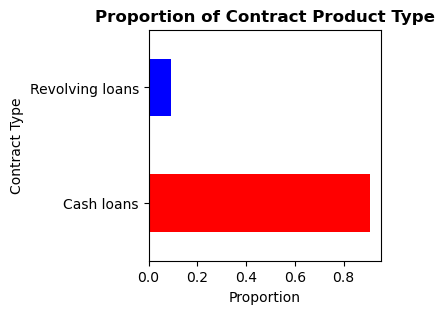

In [312]:
# NAME_CONTRACT_TYPE
plt.figure(figsize=(3,3))
color = ['red', 'blue']
app_data["NAME_CONTRACT_TYPE"].value_counts(normalize=True).plot.barh(width = 0.5 , color= color)

plt.title("Proportion of Contract Product Type",fontsize = 12, fontweight="bold")
plt.xlabel ("Proportion")
plt.ylabel ("Contract Type")


plt.show()

In [313]:
# Observation 1
# from the bar chart it is clealy visible that almost 91% of loans are of Cash type and only 9 % are of Revoloving type.
# That means there is data imbalance with a ratio of 91 : 9

In [314]:
df.loc["NAME_TYPE_SUITE","Description"][0]

'Who was accompanying client when he was applying for the loan'

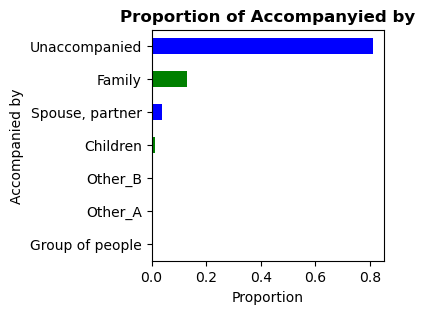

In [315]:
# NAME_TYPE_SUITE
plt.figure(figsize=(3,3))
app_data["NAME_TYPE_SUITE"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5, color = ["blue","green"])

plt.title("Proportion of Accompanyied by",fontsize = 12, fontweight="bold")
plt.xlabel ("Proportion")
plt.ylabel ("Accompanied by")
plt.show()

In [316]:
# Observation
# Most of the clinets are self accompanied while applying for the loan

In [317]:
df.loc["NAME_INCOME_TYPE","Description"]

'Clients income type (businessman, working, maternity leave,…)'

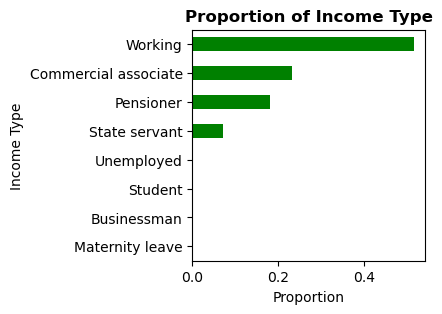

In [318]:
# NAME_INCOME_TYPE

plt.figure(figsize=(3,3))
app_data["NAME_INCOME_TYPE"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5 , color = "green")

plt.title("Proportion of Income Type",fontsize = 12, fontweight="bold")
plt.xlabel ("Proportion")
plt.ylabel ("Income Type")
plt.show()

In [319]:
#observation
# Most of the clinets are working professionals followed by Commercial associates.
# The proportion of unemployed,student , businessman,Maternity leave is very less.

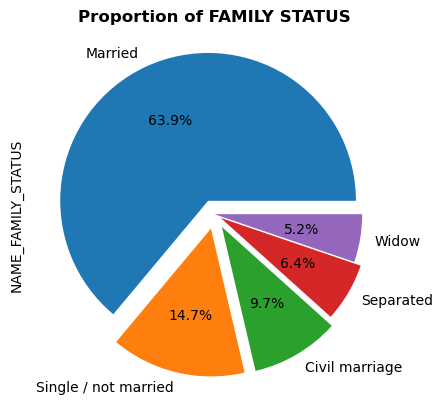

In [320]:
# NAME_FAMILY_STATUS
explode = [0.1, 0.1, 0.1, 0.05, 0]
app_data["NAME_FAMILY_STATUS"].value_counts(normalize=True).plot.pie(explode=explode, labels=["Married","Single / not married","Civil marriage","Separated","Widow"],autopct="%1.1f%%")
plt.title("Proportion of FAMILY STATUS",fontsize = 12, fontweight="bold")
plt.show()

In [321]:
#observation
# Most of the clinets are Married. Here also we can see some data imbalance.

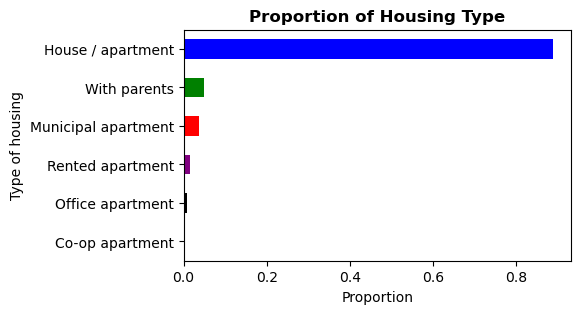

In [322]:
# NAME_HOUSING_TYPE

plt.figure(figsize=(5,3))
color = ['lightblue', 'black', 'purple', 'red', 'green','blue']
app_data["NAME_HOUSING_TYPE"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5,color=color)

plt.title("Proportion of Housing Type",fontsize = 12, fontweight="bold")
plt.xlabel ("Proportion")
plt.ylabel ("Type of housing")
plt.show()

In [323]:
#observation
# Most of the clinets having hosuing type of House / Apartment. The data is heavily imbalance.

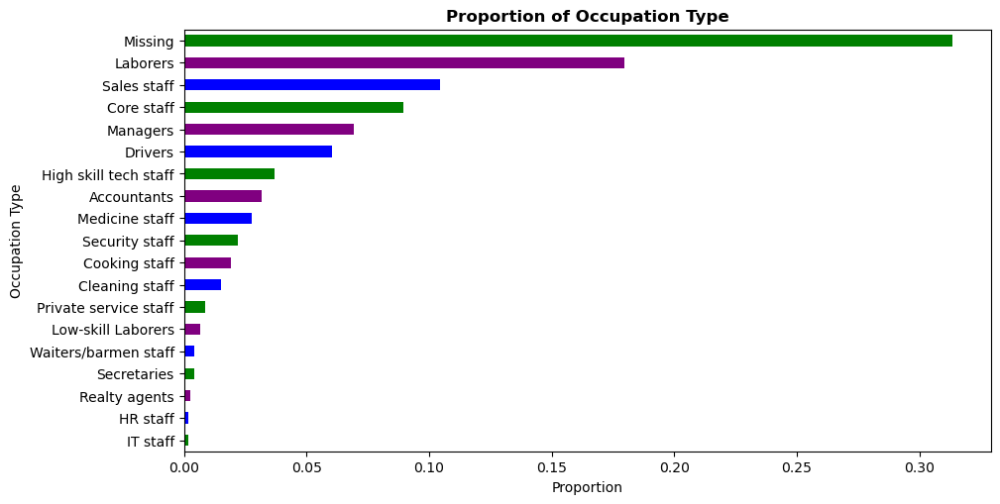

In [324]:
# OCCUPATION_TYPE
plt.figure(figsize=(10,5))
app_data["OCCUPATION_TYPE"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5 , color = ["green","blue","purple"])

plt.title("Proportion of Occupation Type",fontsize = 12, fontweight="bold")
plt.tight_layout()
plt.xlabel ("Proportion")
plt.ylabel ("Occupation Type")

plt.show()

In [325]:
#observation
# Occupation Type is having 31.3 % of Missing values

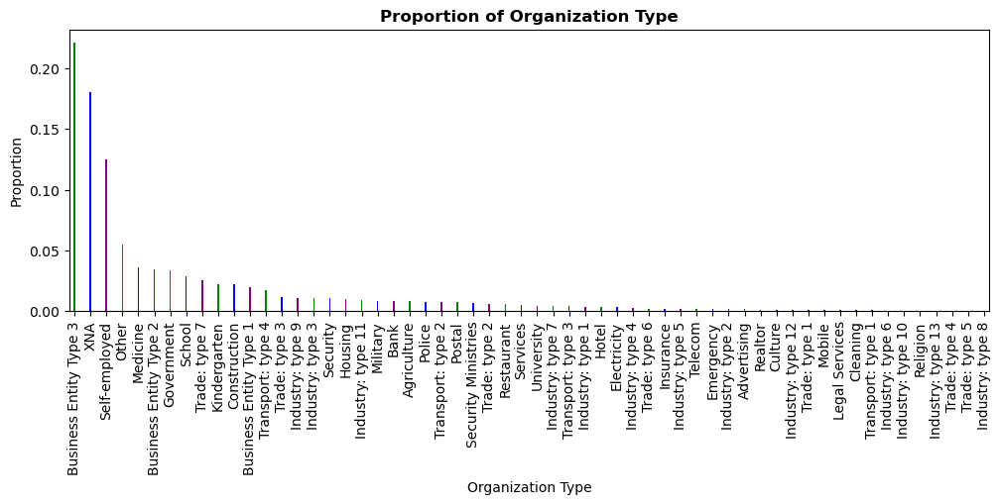

In [326]:
#ORGANIZATION_TYPE
plt.figure(figsize=(10,5))
app_data["ORGANIZATION_TYPE"].value_counts(normalize=True).plot.bar(width = 0.1,color = ["green","blue","purple"])

plt.title("Proportion of Organization Type",fontsize = 12, fontweight="bold")
plt.tight_layout()
plt.ylabel ("Proportion")
plt.xlabel ("Organization Type")

plt.show()

In [327]:
# observation
# Organization Type is having 18% of XNA.

### Sec-2 : Categorical ordered univariate analysis 

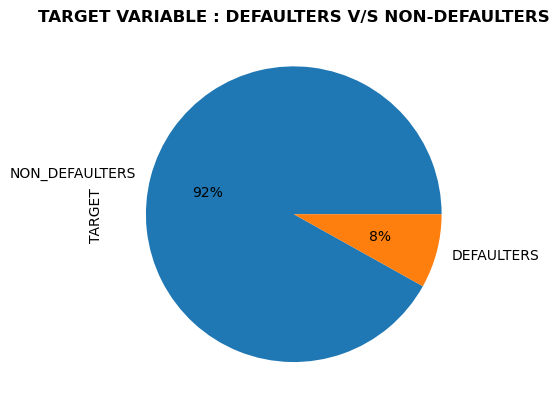

In [328]:
#TARGET variable
app_data["TARGET"].value_counts(normalize=True).plot.pie(labels=["NON_DEFAULTERS","DEFAULTERS"],autopct="%1.f%%")
plt.title("TARGET VARIABLE : DEFAULTERS V/S NON-DEFAULTERS",fontsize = 12, fontweight="bold")
plt.show()

In [329]:
#Obsevation:
# from the pie chart it is clealy visible that almost 92% are NON-DEFAULTERS and only 8% are DEFAULTERS.
# That means there is data imbalance with a ratio of 23 : 2

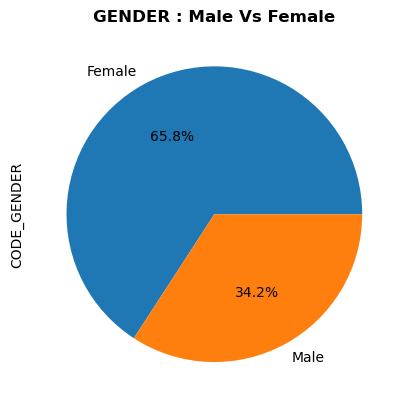

In [330]:
#CODE_GENDER variable
app_data["CODE_GENDER"].value_counts(normalize=True).plot.pie(labels=["Female","Male"],autopct="%1.1f%%")
plt.title("GENDER : Male Vs Female",fontsize = 12, fontweight="bold")
plt.show()

In [331]:
# the ratio of applicant Female : Male is in the ratio of 2:1 (approx)

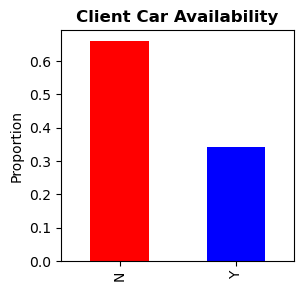

In [332]:
# FLAG_OWN_CAR
plt.figure(figsize=(3,3))

app_data["FLAG_OWN_CAR"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["Red","blue"])

plt.title("Client Car Availability",fontsize = 12, fontweight="bold")
plt.xlabel ("")
plt.ylabel ("Proportion")

plt.show()

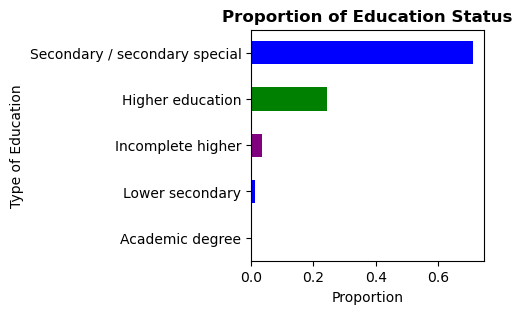

In [333]:
# NAME_EDUCATION_TYPE
plt.figure(figsize=(3,3))

app_data["NAME_EDUCATION_TYPE"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5,color = ["green","blue","purple"])

plt.title("Proportion of Education Status",fontsize = 12, fontweight="bold")
plt.ylabel ("Type of Education")
plt.xlabel ("Proportion")

plt.show()

In [334]:
app_data["NAME_EDUCATION_TYPE"].value_counts(normalize=True)

Secondary / secondary special    0.711199
Higher education                 0.242409
Incomplete higher                0.033412
Lower secondary                  0.012445
Academic degree                  0.000535
Name: NAME_EDUCATION_TYPE, dtype: float64

In [335]:
#observation
#Almost 71 % of the clinets are having highest education of Secondary / secondary special.

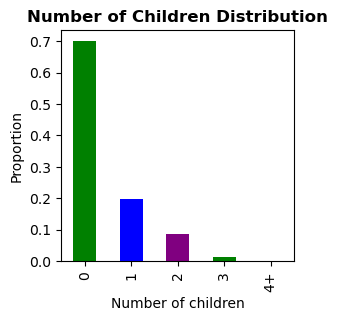

In [336]:
# GRP_CNT_CHILDREN
plt.figure(figsize=(3,3))

app_data["GRP_CNT_CHILDREN"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["green","blue","purple"])

plt.title("Number of Children Distribution",fontsize = 12, fontweight="bold")
plt.xlabel ("Number of children")
plt.ylabel ("Proportion")
plt.show()

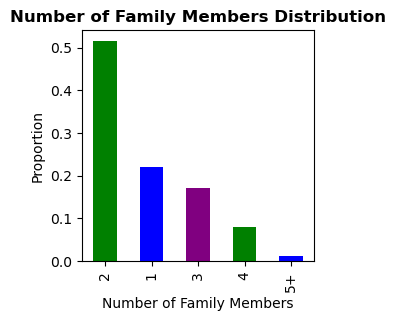

In [337]:
# GRP_CNT_FAM_MEMBERS
plt.figure(figsize=(3,3))

app_data["GRP_CNT_FAM_MEMBERS"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["green","blue","purple"])

plt.title("Number of Family Members Distribution",fontsize = 12, fontweight="bold")
plt.xlabel ("Number of Family Members")
plt.ylabel ("Proportion")
plt.show()

In [338]:
#Observation : Almost 70 % of the clinets are having no children and 50 % of the client are of 2 member family only.

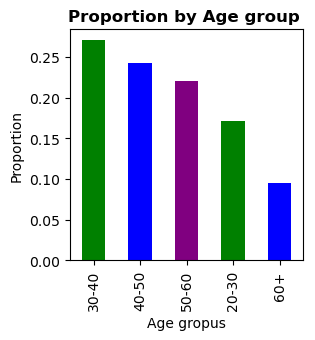

In [339]:
# GRP_AGE
plt.figure(figsize=(3,3))

app_data["GRP_AGE"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["green","blue","purple"])

plt.title("Proportion by Age group ",fontsize = 12, fontweight="bold")
plt.xlabel ("Age gropus")
plt.ylabel ("Proportion")
plt.show()

In [340]:
app_data["GRP_AGE"].value_counts(normalize=True)

30-40    0.270364
40-50    0.242170
50-60    0.220697
20-30    0.171280
60+      0.095488
Name: GRP_AGE, dtype: float64

In [341]:
# Observation The age group of 30-40 ,40-50,50-60 are proportioned by 27% , 24% & 22% respectively

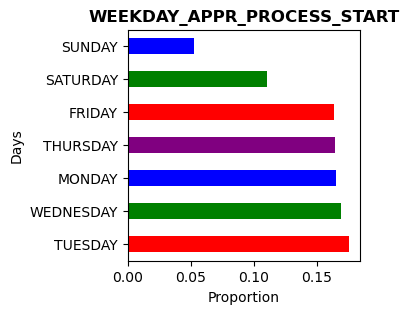

In [342]:
#WEEKDAY_APPR_PROCESS_START
plt.figure(figsize=(3,3))

app_data["WEEKDAY_APPR_PROCESS_START"].value_counts(normalize=True).plot.barh(width = 0.5,color = ["red","green","blue","purple"])

plt.title("WEEKDAY_APPR_PROCESS_START",fontsize = 12, fontweight="bold")
plt.ylabel ("Days")
plt.xlabel ("Proportion")
plt.show()

In [343]:
#obsevation : Most of the application starts of Weekdays.

In [344]:
df.loc["WEEKDAY_APPR_PROCESS_START","Description"][1]

'On which day of the week did the client apply for previous application'

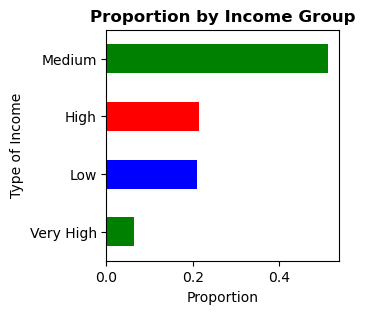

In [345]:
# GRP_INCOME
plt.figure(figsize=(3,3))

app_data["GRP_INCOME"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5,color = ["green","blue","red"])

plt.title("Proportion by Income Group",fontsize = 12, fontweight="bold")
plt.ylabel ("Type of Income")
plt.xlabel ("Proportion")
plt.show()

In [346]:
# Observation Most of the Clients belongs to the medium income group

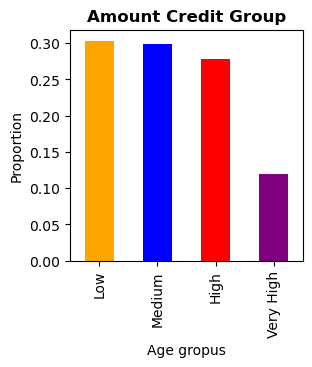

In [347]:
# GRP_AMT_CREDIT
plt.figure(figsize=(3,3))

app_data["GRP_AMT_CREDIT"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["Orange","blue","red","purple"])

plt.title("Amount Credit Group",fontsize = 12, fontweight="bold")
plt.xlabel ("Age gropus")
plt.ylabel ("Proportion")
plt.show()

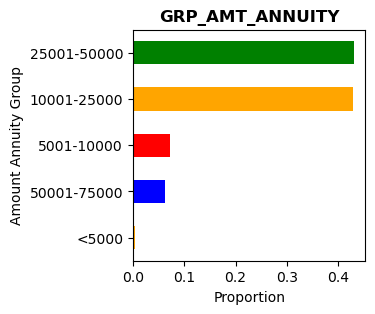

In [348]:
# GRP_AMT_ANNUITY
plt.figure(figsize=(3,3))

app_data["GRP_AMT_ANNUITY"].value_counts(normalize=True).sort_values().plot.barh(width = 0.5,color = ["Orange","blue","red","Orange","green","blue","purple"])

plt.title("GRP_AMT_ANNUITY",fontsize = 12, fontweight="bold")
plt.ylabel ("Amount Annuity Group")
plt.xlabel ("Proportion")
plt.show()

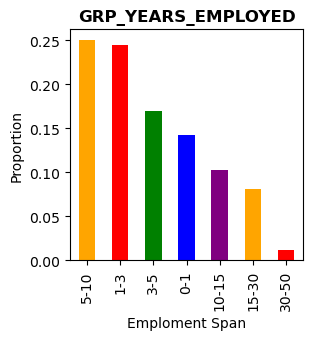

In [349]:
# GRP_YEARS_EMPLOYED
plt.figure(figsize=(3,3))

app_data["GRP_YEARS_EMPLOYED"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["orange","red","green","blue","purple"])

plt.title("GRP_YEARS_EMPLOYED",fontsize = 12, fontweight="bold")
plt.xlabel ("Emploment Span")
plt.ylabel ("Proportion")
plt.show()

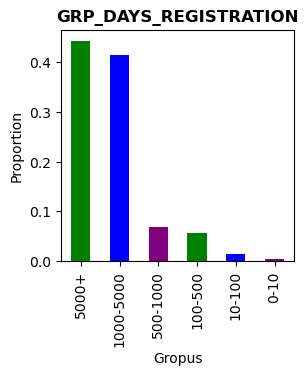

In [350]:
# GRP_DAYS_REGISTRATION
plt.figure(figsize=(3,3))

app_data["GRP_DAYS_REGISTRATION"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["green","blue","purple"])

plt.title("GRP_DAYS_REGISTRATION",fontsize = 12, fontweight="bold")
plt.xlabel ("Gropus")
plt.ylabel ("Proportion")
plt.show()

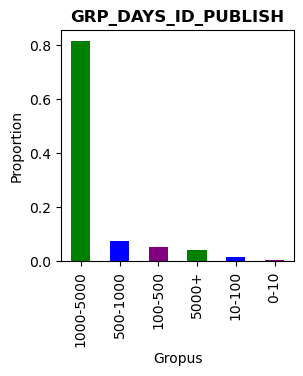

In [351]:
# GRP_DAYS_ID_PUBLISH
plt.figure(figsize=(3,3))

app_data["GRP_DAYS_ID_PUBLISH"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["green","blue","purple"])

plt.title("GRP_DAYS_ID_PUBLISH",fontsize = 12, fontweight="bold")
plt.xlabel ("Gropus")
plt.ylabel ("Proportion")
plt.show()

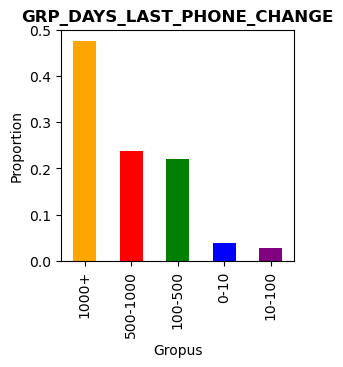

In [352]:
# GRP_DAYS_LAST_PHONE_CHANGE
plt.figure(figsize=(3,3))

app_data["GRP_DAYS_LAST_PHONE_CHANGE"].value_counts(normalize=True).plot.bar(width = 0.5,color = ["orange","red","green","blue","purple"])

plt.title("GRP_DAYS_LAST_PHONE_CHANGE",fontsize = 12, fontweight="bold")
plt.xlabel ("Gropus")
plt.ylabel ("Proportion")
plt.show()

In [353]:
df.loc["REGION_POPULATION_RELATIVE"][1]

'Normalized population of region where client lives (higher number means the client lives in more populated region)'

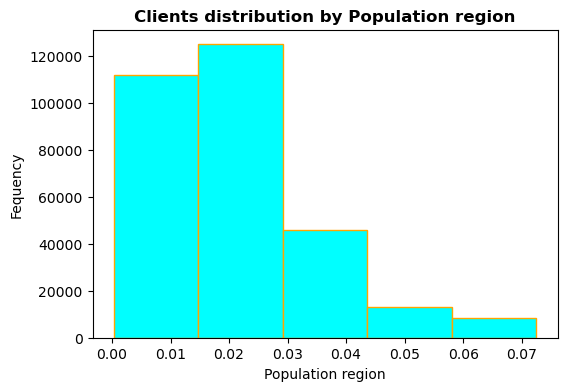

In [354]:
#REGION_POPULATION_RELATIVE
plt.figure(figsize=(6,4
                   ))
plt.hist(app_data["REGION_POPULATION_RELATIVE"], bins = 5,edgecolor='Orange',color='cyan')
plt.title("Clients distribution by Population region",fontsize = 12, fontweight="bold")
plt.ylabel ("Fequency")
plt.xlabel ("Population region")
plt.show()

In [355]:
# Observation: Most of the clients are belongs from low populated region.

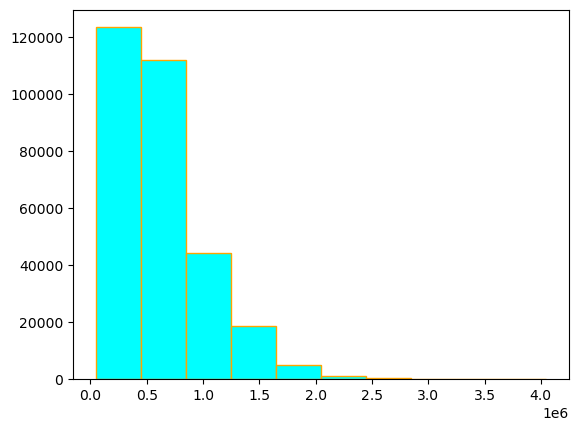

In [356]:
#AMT_CREDIT
plt.hist(app_data["AMT_CREDIT"], bins = 10,edgecolor='Orange',color='cyan')

plt.show()

## BIVARIATE ANALYSIS

In [357]:
app_data.dtypes

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64
FLAG_CONT_MOBILE                  int64


In [358]:
# segregating the numerical and categorical columns
cat_col = app_data.select_dtypes(["object"]).columns.to_list()
digit_col = app_data.select_dtypes(["float"]).columns.to_list()

### Sec-1 : Numeric- numeric analysis

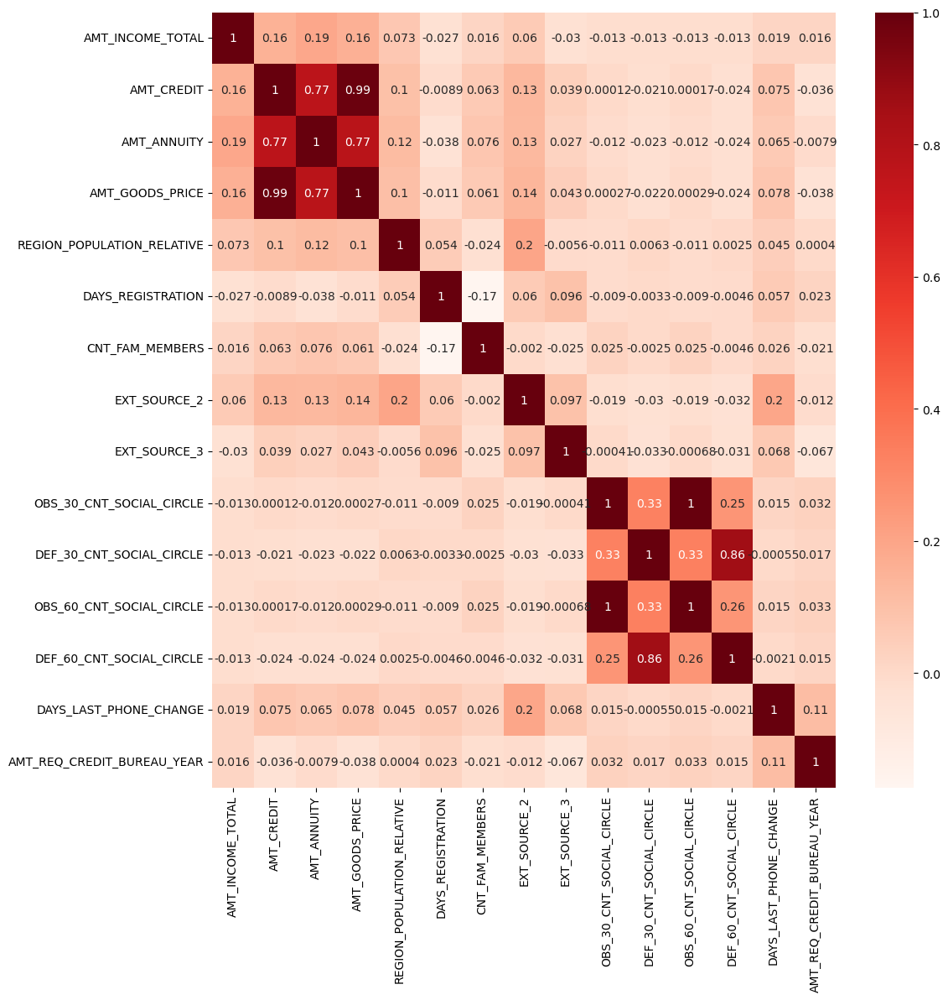

In [359]:
plt.figure(figsize=(12,12))
sns.heatmap( app_data[digit_col[:]].corr(), annot= True, cmap= "Reds")
plt.show()

In [360]:
#The heat has been between the numerical features of the data set.

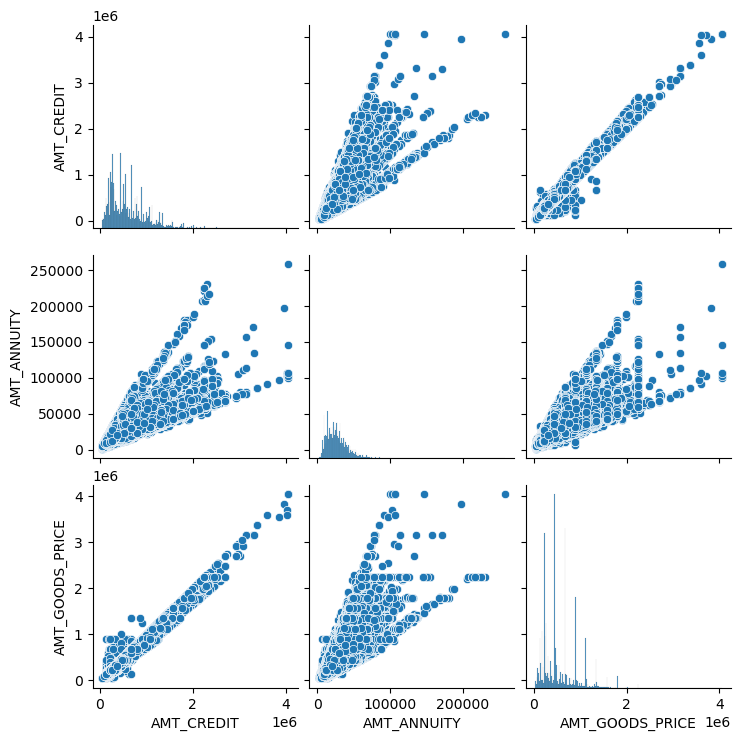

In [361]:
sns.pairplot(data=app_data, vars=["AMT_CREDIT","AMT_ANNUITY", "AMT_GOODS_PRICE"])
plt.show()

In [362]:
# Pair plot has been done to visualize the type of relationship exist in between the variables
#AMT_CREDIT , AMT_ANNUITY & AMT_GOODS_PRICE

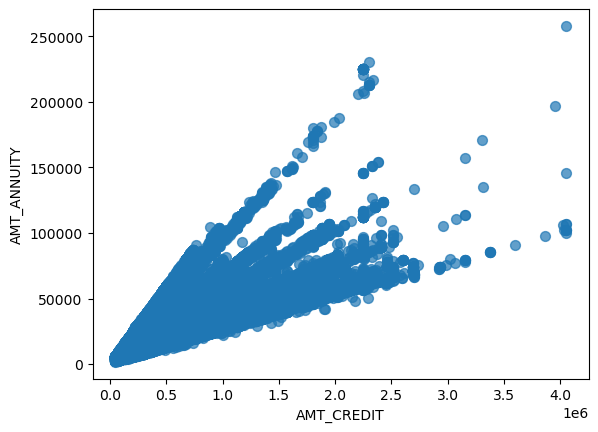

In [363]:
app_data.plot.scatter(x= "AMT_CREDIT" , y= "AMT_ANNUITY",alpha= 0.7, s = 50)
plt.show()

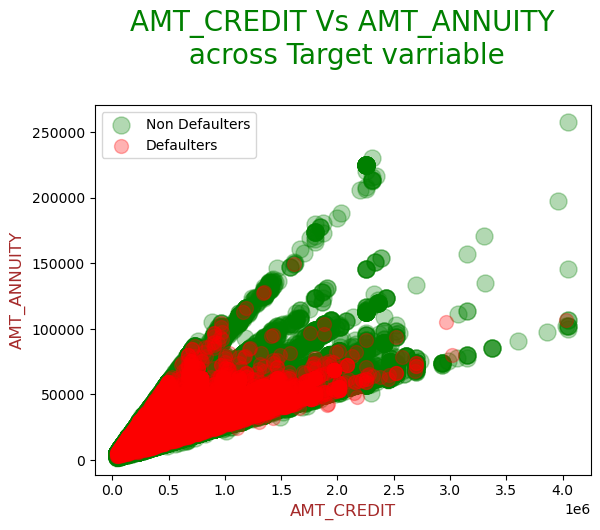

In [364]:
plt.scatter(app_data["AMT_CREDIT"][app_data["TARGET"]==0], app_data["AMT_ANNUITY"][app_data["TARGET"]==0], 
            c= 'Green', alpha= 0.3, s = 150, label="Non Defaulters" )

plt.scatter(app_data["AMT_CREDIT"][app_data["TARGET"]==1], app_data["AMT_ANNUITY"][app_data["TARGET"]==1], 
            c= 'Red', alpha= 0.3, s = 100, label="Defaulters" )


# Adding and formatting title
plt.title("AMT_CREDIT Vs AMT_ANNUITY\n across Target varriable\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Green'})

# Labeling Axes
plt.xlabel("AMT_CREDIT", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("AMT_ANNUITY", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})

plt.legend()

plt.show()

In [365]:
# Observation: The scatter plot shows that as the annuity amout goes beyond 100000 & Credit amount of the loan goes beyond 250000 the defaulters decreases.

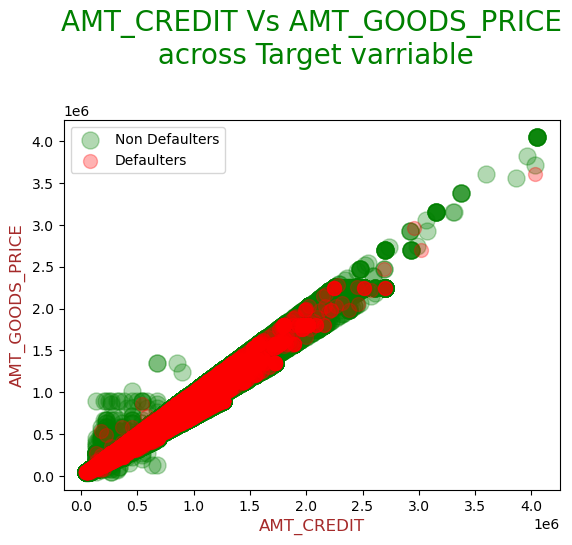

In [366]:
plt.scatter(app_data["AMT_CREDIT"][app_data["TARGET"]==0], app_data["AMT_GOODS_PRICE"][app_data["TARGET"]==0], 
            c= 'Green', alpha= 0.3, s = 150, label="Non Defaulters" )

plt.scatter(app_data["AMT_CREDIT"][app_data["TARGET"]==1], app_data["AMT_GOODS_PRICE"][app_data["TARGET"]==1], 
            c= 'Red', alpha= 0.3, s = 100, label="Defaulters" )


# Adding and formatting title
plt.title("AMT_CREDIT Vs AMT_GOODS_PRICE\n across Target varriable\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Green'})

# Labeling Axes
plt.xlabel("AMT_CREDIT", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("AMT_GOODS_PRICE", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})

plt.legend()

plt.show()

In [367]:
#Observation : Credit amount of the loan is having a linear corelation with the Goods price variable

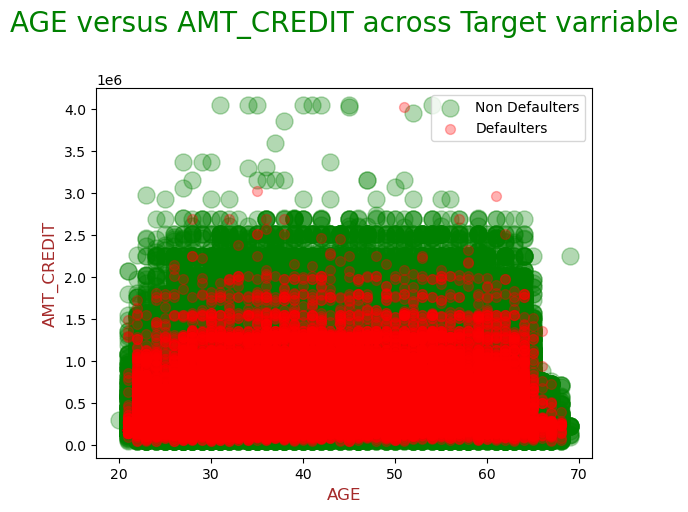

In [368]:
plt.scatter(app_data["AGE"][app_data["TARGET"]==0], app_data["AMT_CREDIT"][app_data["TARGET"]==0], 
            c= 'Green', alpha= 0.3, s = 150, label="Non Defaulters" )

plt.scatter(app_data["AGE"][app_data["TARGET"]==1], app_data["AMT_CREDIT"][app_data["TARGET"]==1], 
            c= 'Red', alpha= 0.3, s = 50, label="Defaulters" )


# Adding and formatting title
plt.title("AGE versus AMT_CREDIT across Target varriable\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Green'})

# Labeling Axes
plt.xlabel("AGE", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("AMT_CREDIT", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})

plt.legend()

plt.show()

In [369]:
#Observation : The credit amount of the loan is less of aged people beyond 65 age group. Also as the Credit amount of the loan goes beyond 200000 the defaulters decreases drastically for all age groups

In [370]:
 app_data["DAYS_EMPLOYED"][(app_data["TARGET"]==0) & (app_data["DAYS_EMPLOYED"]<50000)] 

1         1188
2          225
3         3039
4         3038
5         1588
          ... 
307503     399
307504    7258
307506     236
307508    7921
307510    1262
Name: DAYS_EMPLOYED, Length: 227979, dtype: int64

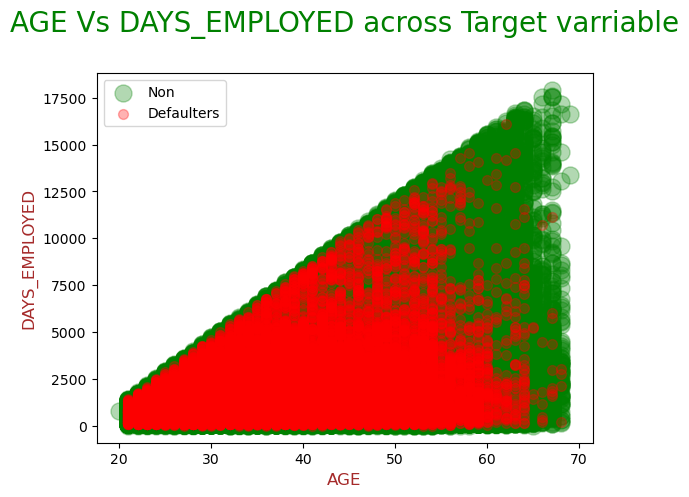

In [371]:
plt.scatter(app_data["AGE"][(app_data["TARGET"]==0) & (app_data["DAYS_EMPLOYED"]<50000)],
            app_data["DAYS_EMPLOYED"][(app_data["TARGET"]==0) & (app_data["DAYS_EMPLOYED"]<50000)], 
            c= 'Green', alpha= 0.3, s = 150, label="Non" )

plt.scatter(app_data["AGE"][(app_data["TARGET"]==1) & (app_data["DAYS_EMPLOYED"]<50000)],
            app_data["DAYS_EMPLOYED"][(app_data["TARGET"]==1) & (app_data["DAYS_EMPLOYED"]<50000)], 
            c= 'Red', alpha= 0.3, s = 50, label="Defaulters" )


# Adding and formatting title
plt.title("AGE Vs DAYS_EMPLOYED across Target varriable\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Green'})

# Labeling Axes
plt.xlabel("AGE", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("DAYS_EMPLOYED", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})

plt.legend()

plt.show()

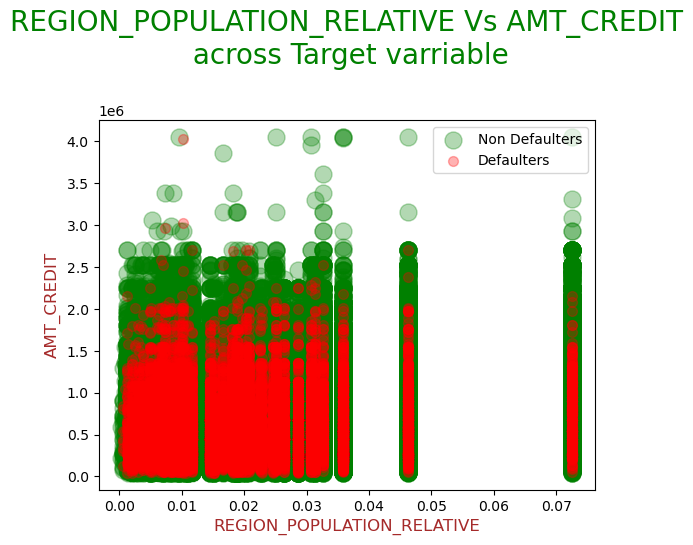

In [372]:
plt.scatter(app_data["REGION_POPULATION_RELATIVE"][app_data["TARGET"]==0], app_data["AMT_CREDIT"][app_data["TARGET"]==0], 
            c= 'Green', alpha= 0.3, s = 150, label="Non Defaulters" )

plt.scatter(app_data["REGION_POPULATION_RELATIVE"][app_data["TARGET"]==1], app_data["AMT_CREDIT"][app_data["TARGET"]==1], 
            c= 'Red', alpha= 0.3, s = 50, label="Defaulters" )


# Adding and formatting title
plt.title("REGION_POPULATION_RELATIVE Vs AMT_CREDIT\n across Target varriable\n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Green'})

# Labeling Axes
plt.xlabel("REGION_POPULATION_RELATIVE", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("AMT_CREDIT", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})

plt.legend()

plt.show()

In [373]:
#Observation : Most of the clients are belongs from low populated region. Also it is safe to provide loans for high density population (>0.07 )people beyond credit amount of 200000.

### Sec-2 : categorical categorical variable

In [374]:
app_data["TARGET"].value_counts(normalize= True)

0    0.919
1    0.081
Name: TARGET, dtype: float64

In [375]:
#defaulter Rate:
app_data["TARGET"].mean()

0.08099996387888261

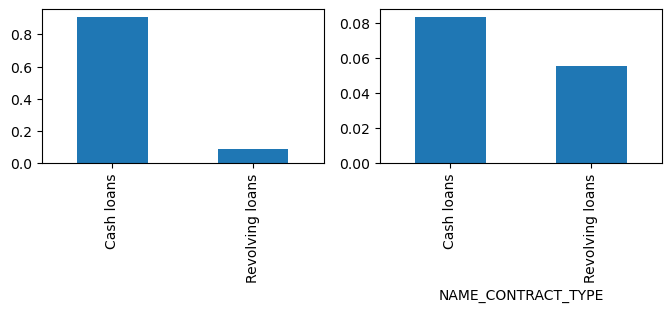

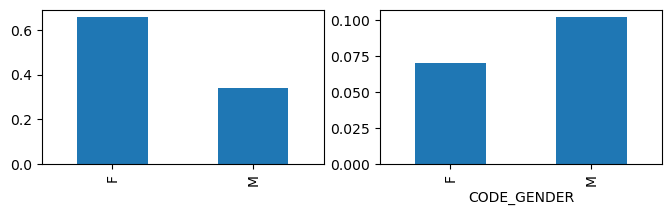

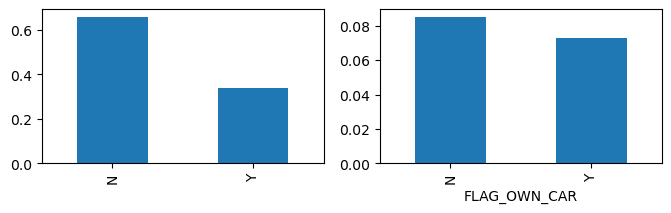

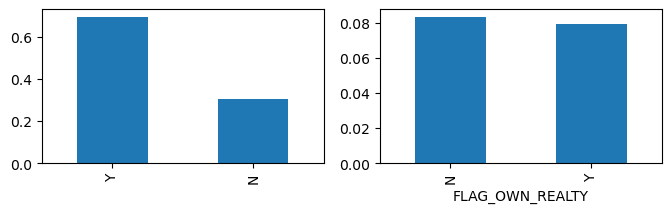

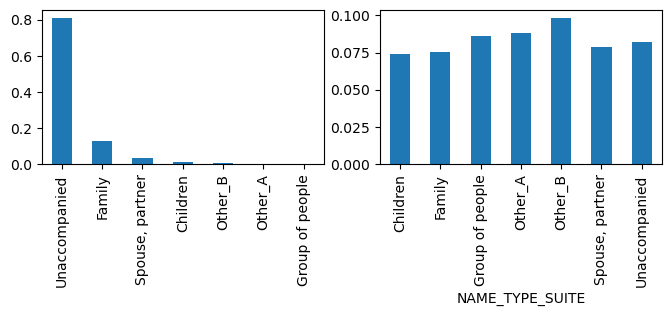

...

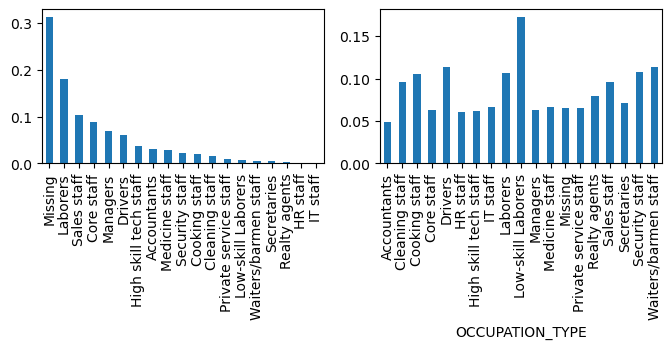

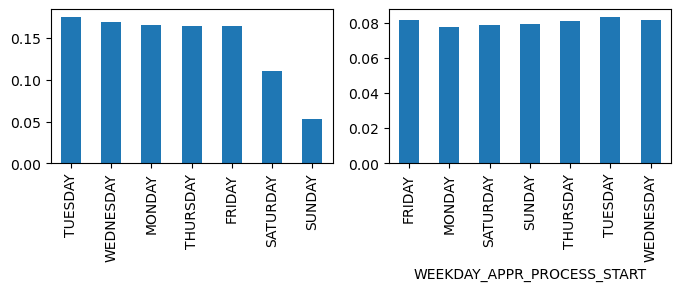

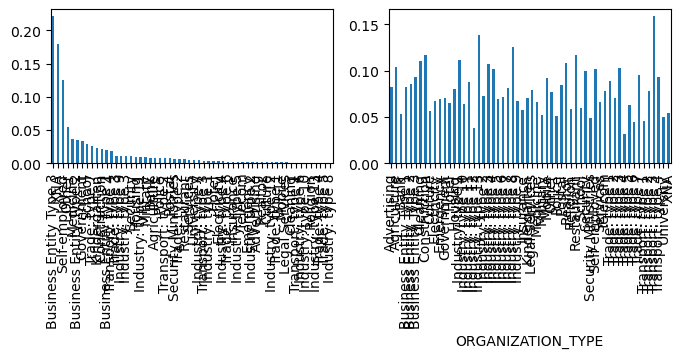

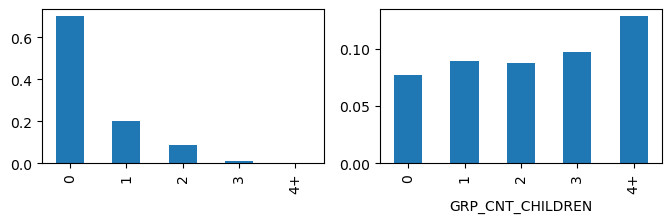

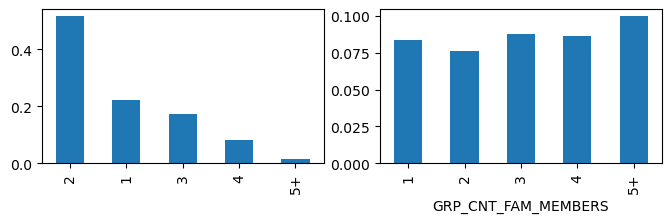

In [376]:
for i in cat_col[:]:
    plt.figure(figsize=[8,2])
    plt.subplot(1, 2, 1)
    app_data[i].value_counts(normalize= True).plot.bar()
    plt.subplot(1, 2, 2)
    app_data.groupby([i])['TARGET'].mean().plot.bar()
    plt.show()

In [377]:
#loop has been run to find relationship between categorical categorical variable.

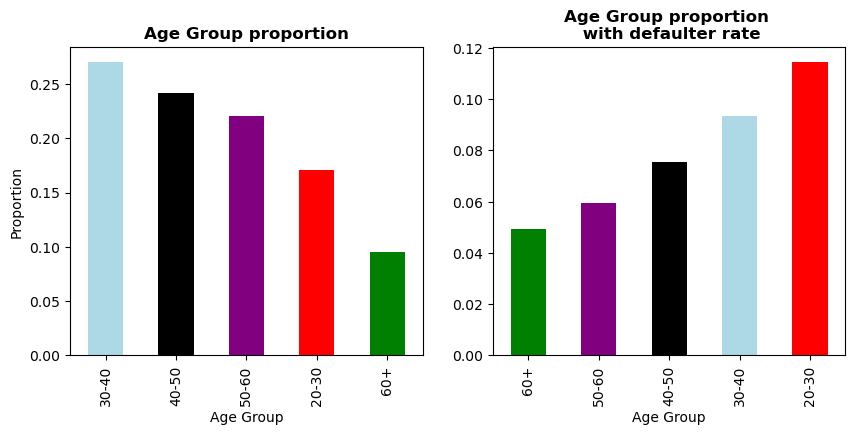

In [378]:
#GRP_AGE
plt.figure(figsize=[10,4])
plt.subplot(1, 2, 1)
app_data["GRP_AGE"].value_counts(normalize= True).plot.bar(color = color)
plt.ylabel ("Proportion")
plt.xlabel ("Age Group")
plt.title("Age Group proportion",fontsize = 12, fontweight="bold")
plt.subplot(1, 2, 2)
color2 = ['green', 'purple', 'black','lightblue','red']
app_data.groupby(['GRP_AGE'])['TARGET'].mean().sort_values().plot.bar(color = color2)
plt.title("Age Group proportion \n with defaulter rate",fontsize = 12, fontweight="bold")
plt.xlabel ("Age Group");

In [379]:
# Observation : The 60+ age group is having lowest proportion in taking loans as well as lowest defaulter rate.
# 20 -30 age grp is having the highest Defaulter rate.

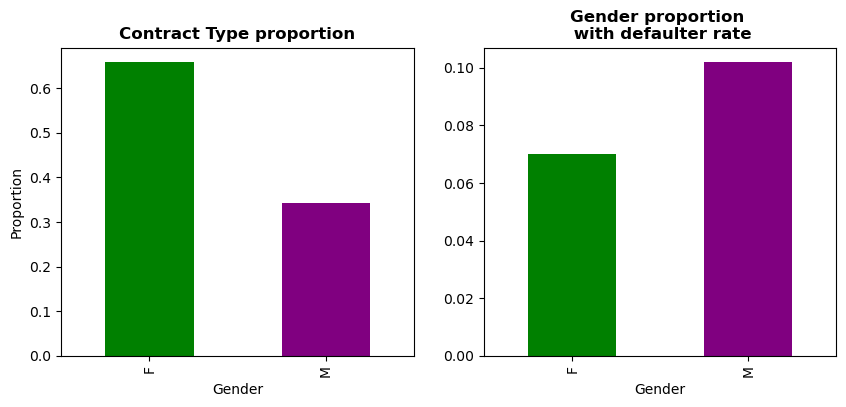

In [380]:
#CODE_GENDER
plt.figure(figsize=[10,4])
plt.subplot(1, 2, 1)
app_data["CODE_GENDER"].value_counts(normalize= True).plot.bar(color = color2)
plt.ylabel ("Proportion")
plt.xlabel ("Gender")
plt.title("Contract Type proportion",fontsize = 12, fontweight="bold")
plt.subplot(1, 2, 2)
app_data.groupby(['CODE_GENDER'])['TARGET'].mean().sort_values().plot.bar(color = color2)
plt.title("Gender proportion \n with defaulter rate",fontsize = 12, fontweight="bold")
plt.xlabel ("Gender");

In [381]:
## Observation : Females are the most Highest loan takers but males are highest in terms of defaulter rate

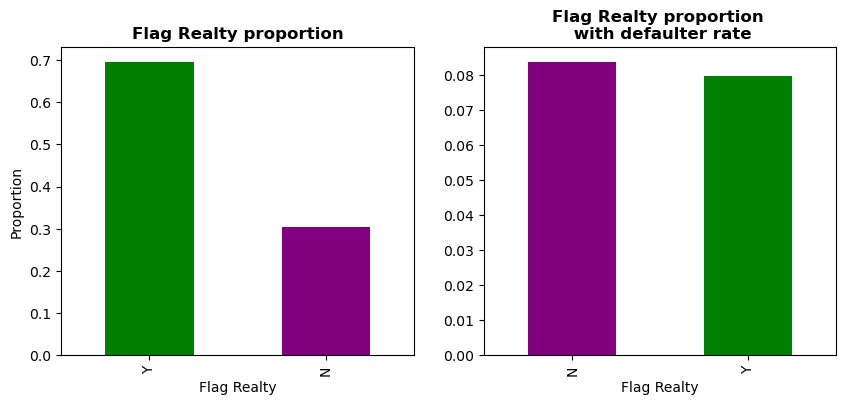

In [382]:
plt.figure(figsize=[10,4])
plt.subplot(1, 2, 1)
app_data["FLAG_OWN_REALTY"].value_counts(normalize= True).plot.bar(color = color2)
plt.ylabel ("Proportion")
plt.xlabel ("Flag Realty")
plt.title("Flag Realty proportion",fontsize = 12, fontweight="bold")
plt.subplot(1, 2, 2)
color2 = ['purple', 'green']
app_data.groupby(['FLAG_OWN_REALTY'])['TARGET'].mean().plot.bar(color = color2)
plt.title("Flag Realty proportion \n with defaulter rate",fontsize = 12, fontweight="bold")
plt.xlabel ("Flag Realty");

In [383]:
#Observation : The defaulter rate is almost same for flag reality.

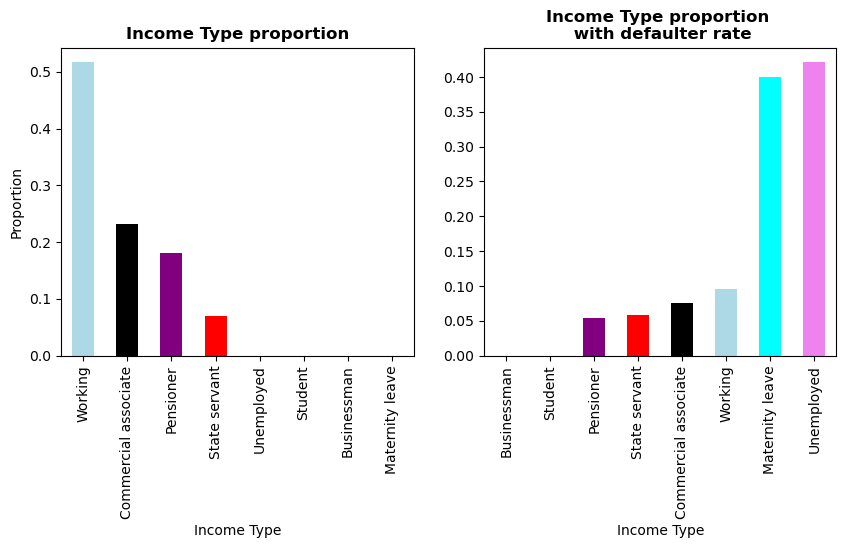

In [384]:
plt.figure(figsize=[10,4])
color = ['lightblue', 'black', 'purple', 'red', 'green','blue',"cyan","violet"]
plt.subplot(1, 2, 1)
app_data["NAME_INCOME_TYPE"].value_counts(normalize=True).plot.bar(color = color)
plt.ylabel ("Proportion")
plt.xlabel ("Income Type")
plt.title("Income Type proportion",fontsize = 12, fontweight="bold")
plt.subplot(1, 2, 2)
color4 = ['lightblue', 'black', 'purple', 'red', 'black','lightblue',"cyan","violet"]
app_data.groupby(['NAME_INCOME_TYPE'])['TARGET'].mean().sort_values().plot.bar(color = color4)
plt.title("Income Type proportion \n with defaulter rate",fontsize = 12, fontweight="bold")
plt.xlabel ("Income Type");

In [385]:
#Observation : No businessman and student has defaulted and all the Maternity leave income type client has defaulted.

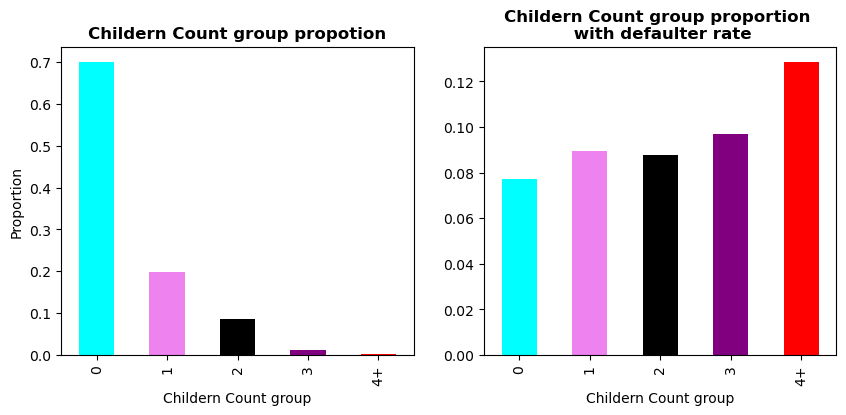

In [386]:
plt.figure(figsize=[10,4])
plt.subplot(1, 2, 1)
color = ['cyan', "violet",'black', 'purple', 'red', 'green','blue',"cyan","violet"]
app_data["GRP_CNT_CHILDREN"].value_counts(normalize=True).plot.bar(color = color)
plt.ylabel ("Proportion")
plt.xlabel ("Childern Count group")
plt.title("Childern Count group propotion",fontsize = 12, fontweight="bold")
plt.subplot(1, 2, 2)
app_data.groupby(['GRP_CNT_CHILDREN'])['TARGET'].mean().plot.bar(color= color)
plt.title("Childern Count group proportion \n with defaulter rate",fontsize = 12, fontweight="bold")
plt.xlabel ("Childern Count group");

In [387]:
#Observation : Client having more than 4 children having the highest defaulter rate.

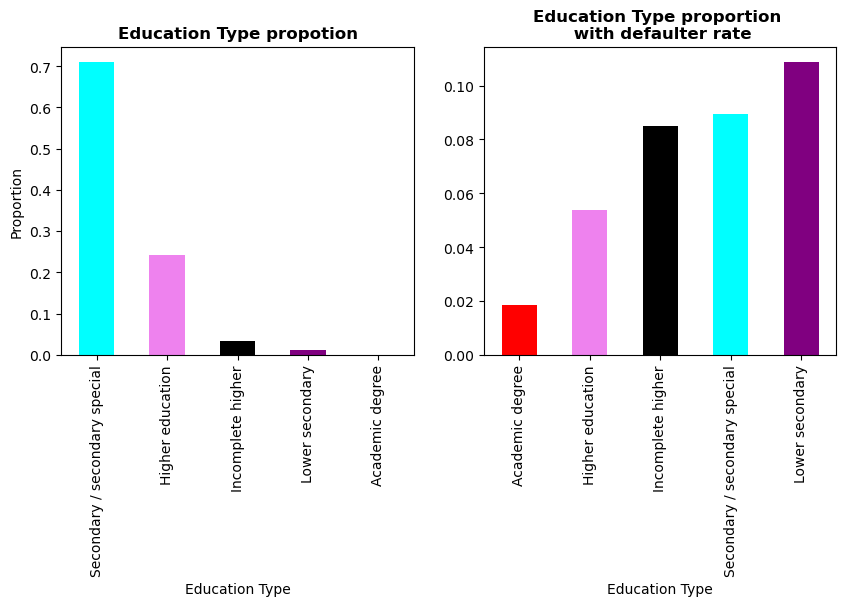

In [388]:
plt.figure(figsize=[10,4])
plt.subplot(1, 2, 1)
color = ['cyan', "violet",'black', 'purple', 'red', 'green','blue',"cyan","violet"]
app_data["NAME_EDUCATION_TYPE"].value_counts(normalize= True).plot.bar(color = color)
plt.ylabel ("Proportion")
plt.xlabel ("Education Type")
plt.title("Education Type propotion",fontsize = 12, fontweight="bold")
plt.subplot(1, 2, 2)
color5 = ['red', "violet",'black', 'cyan', 'purple', 'green','blue',"cyan","violet"]
app_data.groupby(['NAME_EDUCATION_TYPE'])['TARGET'].mean().sort_values().plot.bar(color=color5)
plt.title("Education Type proportion \n with defaulter rate",fontsize = 12, fontweight="bold")
plt.xlabel ("Education Type");

In [389]:
# Observation : The proportion of lower academy and Academy degree is very low but compared to defaulter rate it is high.
# The secondary defaulter rate is also high.

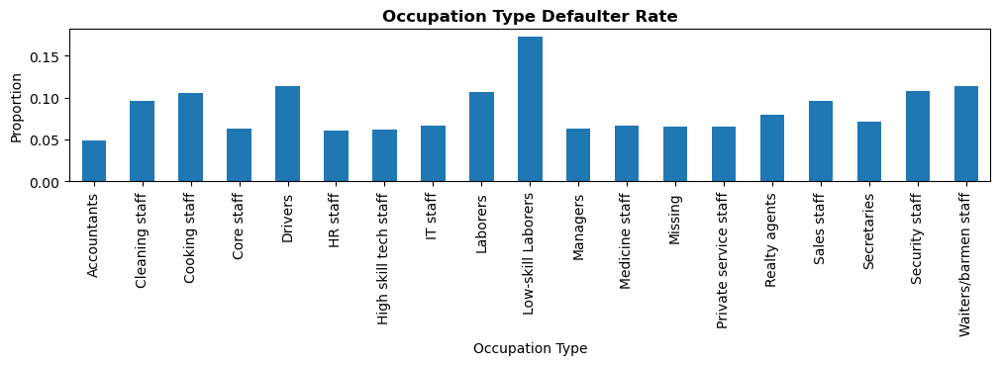

In [390]:
plt.figure(figsize=(12,2))
app_data.groupby(["OCCUPATION_TYPE"])["TARGET"].mean().plot.bar()
plt.ylabel ("Proportion")
plt.xlabel ("Occupation Type")
plt.title("Occupation Type Defaulter Rate",fontsize = 12, fontweight="bold");

In [391]:
# Observation : Low Skill Laborers have the highest default rate among all the occupation type 

## Multivariate analysis 

In [392]:
new_cat_col = cat_col[6:10] + cat_col[12:14] +["GRP_AGE" , "GRP_YEARS_EMPLOYED","ORGANIZATION_TYPE"]

In [393]:
new_cat_col

['NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'GRP_CNT_CHILDREN',
 'GRP_CNT_FAM_MEMBERS',
 'GRP_AGE',
 'GRP_YEARS_EMPLOYED',
 'ORGANIZATION_TYPE']

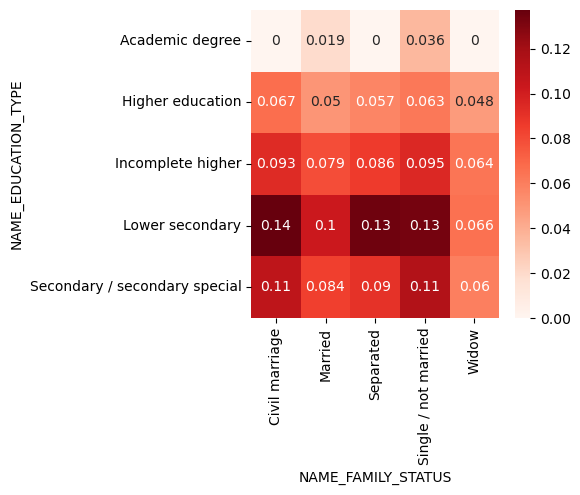

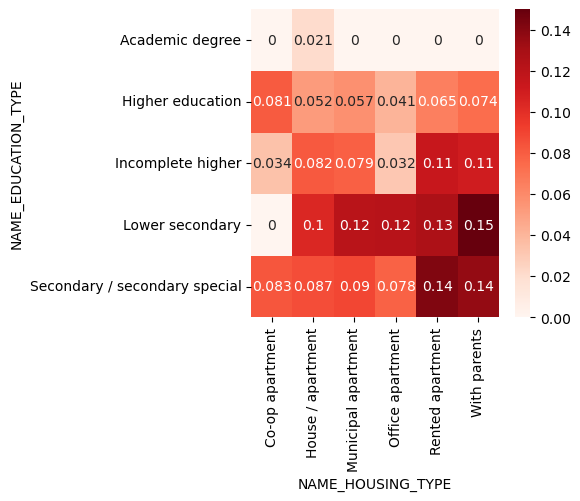

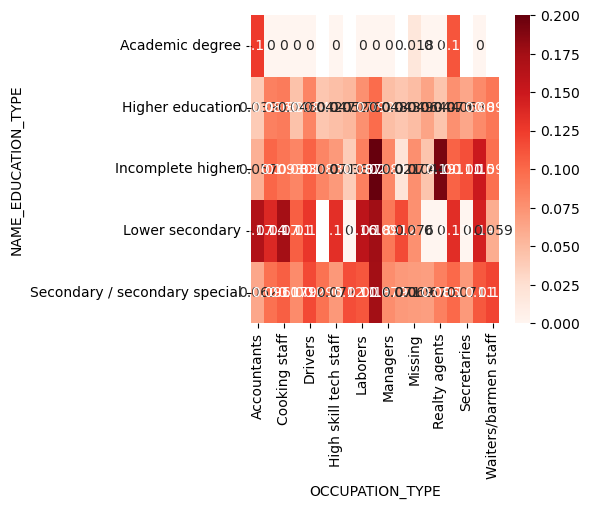

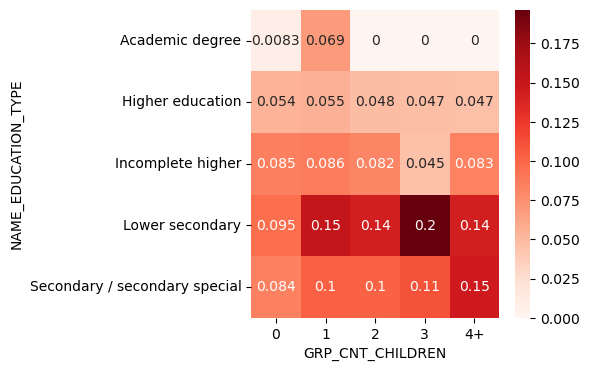

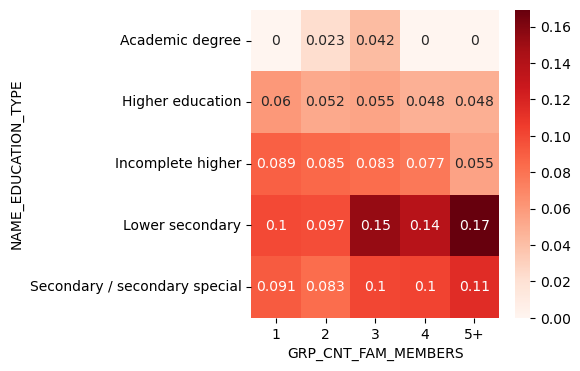

...

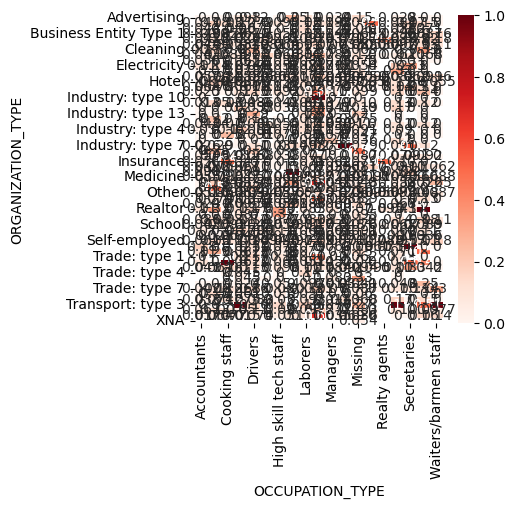

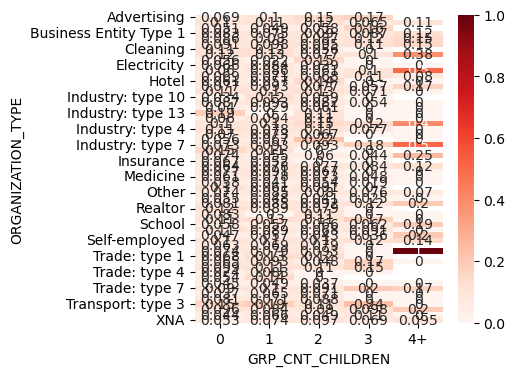

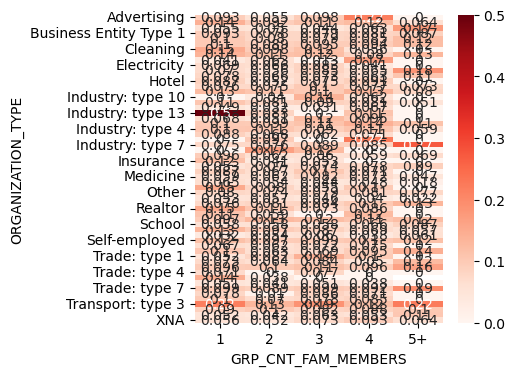

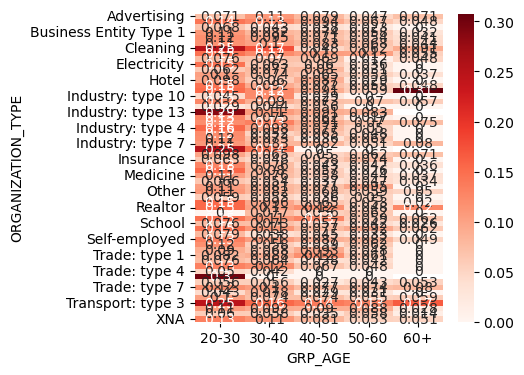

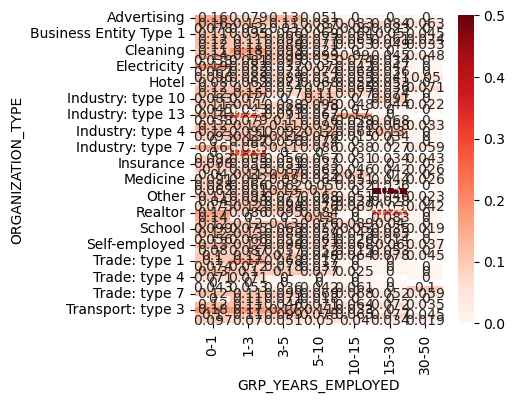

In [394]:
for i in new_cat_col[:]:
    for j in new_cat_col[:]:
        if i!=j:
            plt.figure(figsize=(4,4))
            res=pd.pivot_table(data=app_data, index=i, columns=j, values="TARGET")
            sns.heatmap(res, annot= True, cmap="Reds")
            plt.show()

In [395]:
#TOP 10 Correlation for New_application data frame.
corr_1 = app_data.corr().abs().unstack().sort_values(ascending=False).drop_duplicates().dropna()
corr_1[0:11]

SK_ID_CURR                   SK_ID_CURR                     1.000000
DAYS_EMPLOYED                YEARS_EMPLOYED                 1.000000
                             FLAG_EMP_PHONE                 0.999752
YEARS_EMPLOYED               FLAG_EMP_PHONE                 0.999751
DAYS_BIRTH                   AGE                            0.999711
OBS_30_CNT_SOCIAL_CIRCLE     OBS_60_CNT_SOCIAL_CIRCLE       0.998495
AMT_CREDIT                   AMT_GOODS_PRICE                0.986975
REGION_RATING_CLIENT         REGION_RATING_CLIENT_W_CITY    0.950608
CNT_FAM_MEMBERS              CNT_CHILDREN                   0.879268
DEF_60_CNT_SOCIAL_CIRCLE     DEF_30_CNT_SOCIAL_CIRCLE       0.860710
LIVE_REGION_NOT_WORK_REGION  REG_REGION_NOT_WORK_REGION     0.860057
dtype: float64

## Merging Both the data frames

In [396]:
#Merging both data frames
merged_data=pd.merge(app_data,pre_app,how="inner",on="SK_ID_CURR")
merged_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR,GRP_CNT_CHILDREN,GRP_INCOME,GRP_AMT_CREDIT,GRP_AMT_GOODS_PRICE,GRP_AMT_ANNUITY,GRP_CNT_FAM_MEMBERS,AGE,GRP_AGE,YEARS_EMPLOYED,GRP_YEARS_EMPLOYED,GRP_DAYS_REGISTRATION,GRP_DAYS_ID_PUBLISH,GRP_DAYS_LAST_PHONE_CHANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,High,Medium,Medium,10001-25000,1,25,20-30,1,0-1,1000-5000,1000-5000,1000+,1038818,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,XAP,Approved,-606,XNA,XAP,NaN,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510764,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,High,NaN,NaN,25001-50000,2,45,40-50,3,1-3,1000-5000,100-500,500-1000,1810518,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12,Y,1,NaN,NaN,NaN,XNA,Approved,-746,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510764,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,High,NaN,NaN,25001-50000,2,45,40-50,3,1-3,1000-5000,100-500,500-1000,2636178,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.000000,NaN,NaN,XAP,Approved,-828,Cash through the bank,XAP,Family,Refreshed,Furniture,POS,XNA,Stone,1400,Furnit

In [397]:
#Checking the shape of merge data frame
merged_data.shape

(1405123, 117)

In [398]:
#Checking the null value in merge data frame
(merged_data.isnull().sum()/merged_data.shape[0])*100

SK_ID_CURR                       0.000000
TARGET                           0.000000
NAME_CONTRACT_TYPE_x             0.000000
CODE_GENDER                      0.003914
FLAG_OWN_CAR                     0.000000
FLAG_OWN_REALTY                  0.000000
CNT_CHILDREN                     0.000000
AMT_INCOME_TOTAL                 0.000000
AMT_CREDIT_x                     0.000000
AMT_ANNUITY_x                    0.000000
AMT_GOODS_PRICE_x                0.000000
NAME_TYPE_SUITE_x                0.000000
NAME_INCOME_TYPE                 0.000000
NAME_EDUCATION_TYPE              0.000000
NAME_FAMILY_STATUS               0.000000
NAME_HOUSING_TYPE                0.000000
REGION_POPULATION_RELATIVE       0.000000
DAYS_BIRTH                       0.000000
DAYS_EMPLOYED                    0.000000
DAYS_REGISTRATION                0.000000
DAYS_ID_PUBLISH                  0.000000
FLAG_MOBIL                       0.000000
FLAG_EMP_PHONE                   0.000000
FLAG_WORK_PHONE                  0

In [399]:
#Removing columns with more than 40% null value in merge data frame
merged_data = merged_data.loc[:, (merged_data.isnull().sum()/merged_data.shape[0])*100<=40]

In [400]:
#Checking the null value in merge data frame again
((merged_data.isnull().sum()/merged_data.shape[0])*100).sort_values(ascending=False)

NFLAG_INSURED_ON_APPROVAL       39.694390
DAYS_TERMINATION                39.694390
DAYS_LAST_DUE                   39.694390
DAYS_LAST_DUE_1ST_VERSION       39.694390
DAYS_FIRST_DUE                  39.694390
DAYS_FIRST_DRAWING              39.694390
GRP_YEARS_EMPLOYED              26.944687
AMT_GOODS_PRICE_y               22.615814
AMT_ANNUITY_y                   21.739947
CNT_PAYMENT                     21.739591
GRP_AMT_CREDIT                  15.479855
GRP_AMT_GOODS_PRICE             10.377739
GRP_DAYS_LAST_PHONE_CHANGE       9.378894
GRP_INCOME                       0.894441
GRP_AMT_ANNUITY                  0.583935
GRP_DAYS_REGISTRATION            0.023841
PRODUCT_COMBINATION              0.022062
GRP_DAYS_ID_PUBLISH              0.004911
CODE_GENDER                      0.003914
GRP_AGE                          0.000285
AMT_CREDIT_y                     0.000071
NAME_CONTRACT_STATUS             0.000000
FLAG_DOCUMENT_21                 0.000000
CHANNEL_TYPE                     0

In [401]:
#head of merged data
merged_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_YEAR,GRP_CNT_CHILDREN,GRP_INCOME,GRP_AMT_CREDIT,GRP_AMT_GOODS_PRICE,GRP_AMT_ANNUITY,GRP_CNT_FAM_MEMBERS,AGE,GRP_AGE,YEARS_EMPLOYED,GRP_YEARS_EMPLOYED,GRP_DAYS_REGISTRATION,GRP_DAYS_ID_PUBLISH,GRP_DAYS_LAST_PHONE_CHANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,9461,637,3648.0,2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,0,High,Medium,Medium,10001-25000,1,25,20-30,1,0-1,1000-5000,1000-5000,1000+,1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,XAP,Approved,-606,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510764,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,High,NaN,NaN,25001-50000,2,45,40-50,3,1-3,1000-5000,100-500,500-1000,1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,-746,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,16765,1188,1186.0,291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.622246,0.510764,1.0,0.0,1.0,0.0,828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0,High,NaN,NaN,25001-50000,2,45,40-50,3,1-3,1000-5000,100-500,500-1000,2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,-828,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher educa

## Bi-Variate analysis of merged data frame

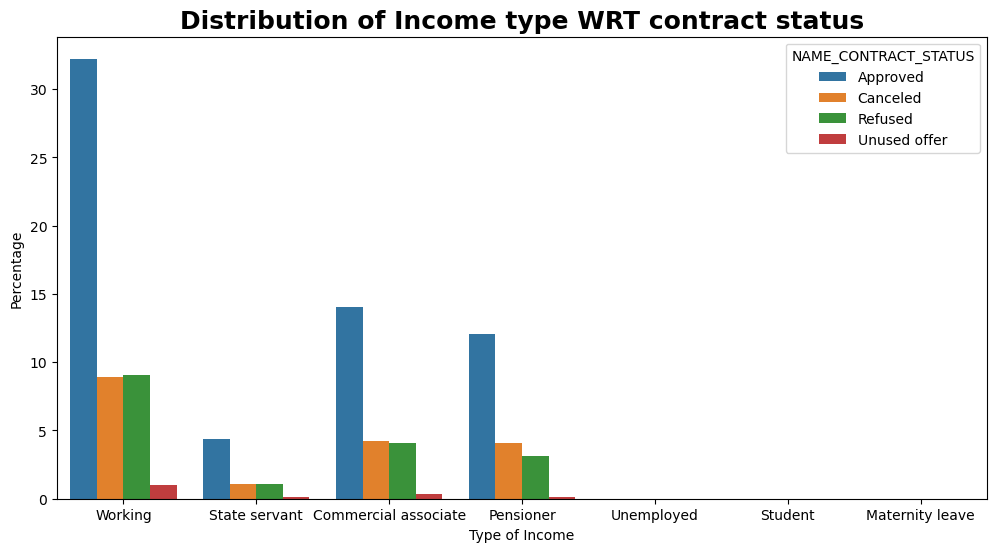

In [402]:
plt.figure(figsize=(12,6))

sns.countplot(data=merged_data,x="NAME_INCOME_TYPE",hue="NAME_CONTRACT_STATUS",stat = "percent")
plt.xlabel("Type of Income",fontsize = 10)
plt.ylabel("Percentage",fontsize = 10)

plt.title('Distribution of Income type WRT contract status',fontsize = 18, fontweight='bold')
plt.show()

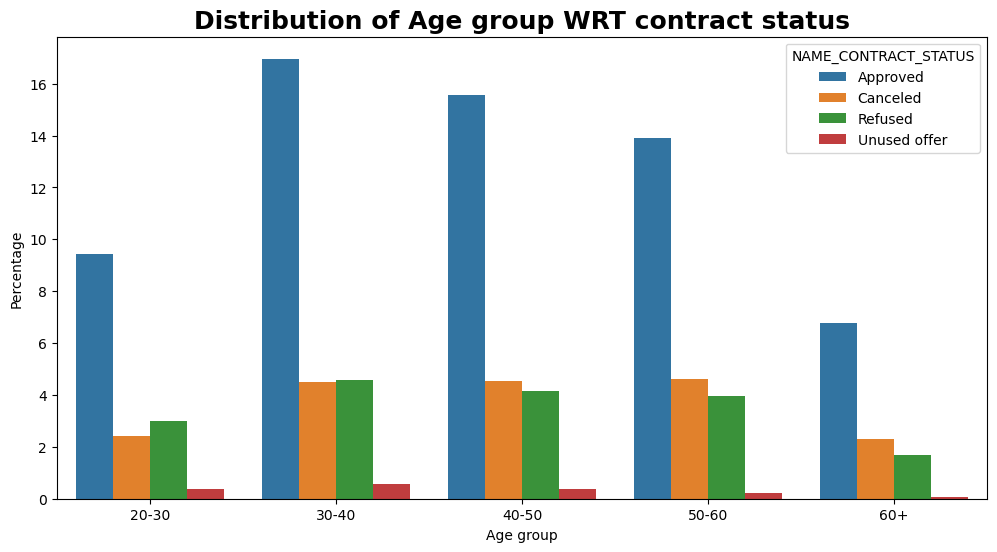

In [403]:
plt.figure(figsize=(12,6))

sns.countplot(data=merged_data,x="GRP_AGE",hue="NAME_CONTRACT_STATUS",stat = "percent")
plt.xlabel("Age group",fontsize = 10)
plt.ylabel("Percentage",fontsize = 10)

plt.title('Distribution of Age group WRT contract status',fontsize = 18, fontweight='bold')
plt.show()

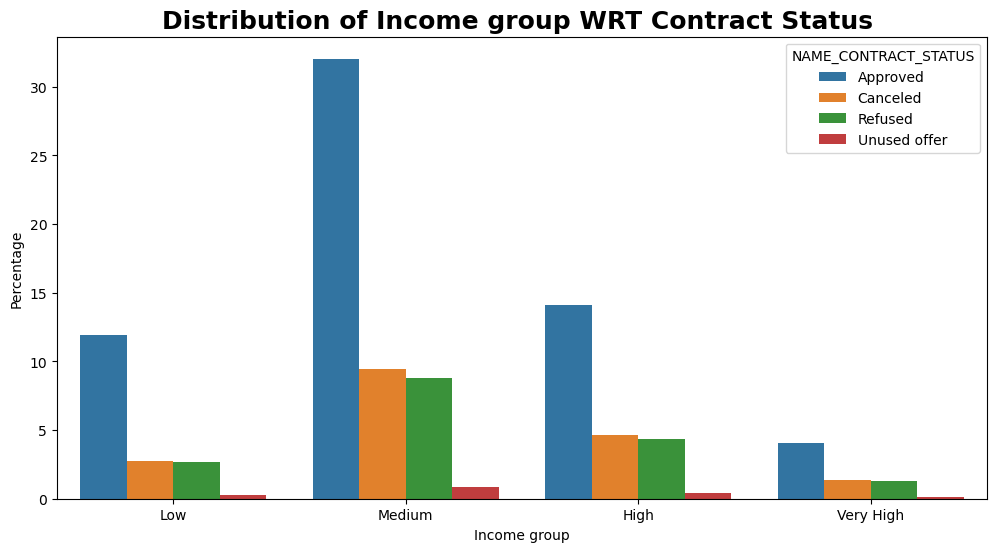

In [404]:
plt.figure(figsize=(12,6))

sns.countplot(data=merged_data,x="GRP_INCOME",hue="NAME_CONTRACT_STATUS",stat = "percent")
plt.xlabel("Income group",fontsize = 10)
plt.ylabel("Percentage",fontsize = 10)

plt.title('Distribution of Income group WRT Contract Status ',fontsize = 18, fontweight='bold')
plt.show()

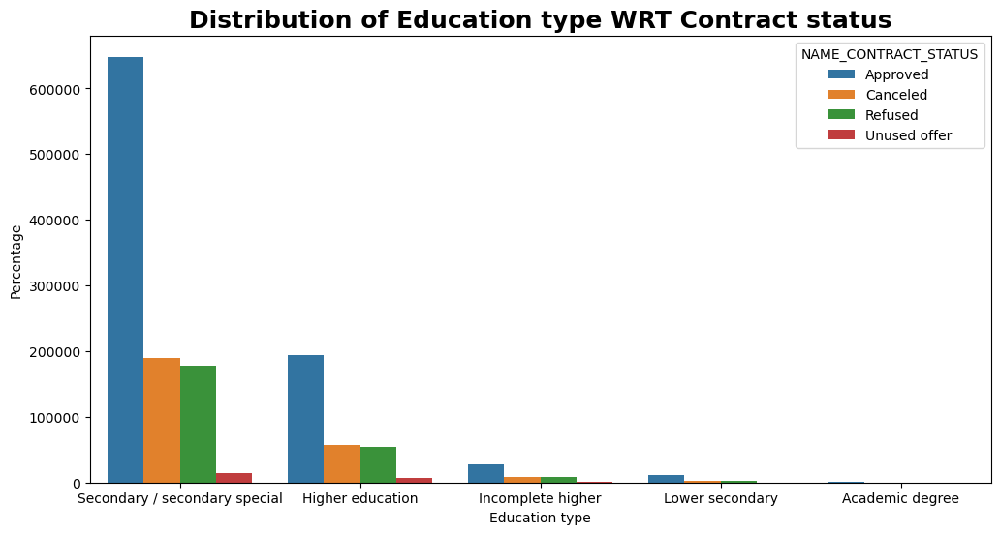

In [405]:
plt.figure(figsize=(12,6))

sns.countplot(data=merged_data,x="NAME_EDUCATION_TYPE",hue="NAME_CONTRACT_STATUS")
plt.xlabel("Education type",fontsize = 10)
plt.ylabel("Percentage",fontsize = 10)

plt.title('Distribution of Education type WRT Contract status',fontsize = 18, fontweight='bold');

In [406]:
# observation Secondary/Secondary special education type is having majority of approved loans in previous applicants.

## Multi-Variate Analysis

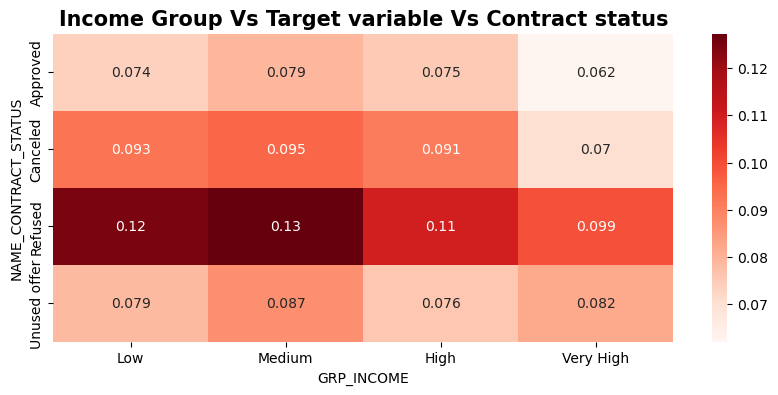

In [407]:
plt.figure(figsize=(10,4))
res=pd.pivot_table(data=merged_data, index="NAME_CONTRACT_STATUS", columns="GRP_INCOME", values="TARGET")
sns.heatmap(res, annot= True, cmap="Reds")
plt.title('Income Group Vs Target variable Vs Contract status',fontsize = 15, fontweight='bold');
plt.show()

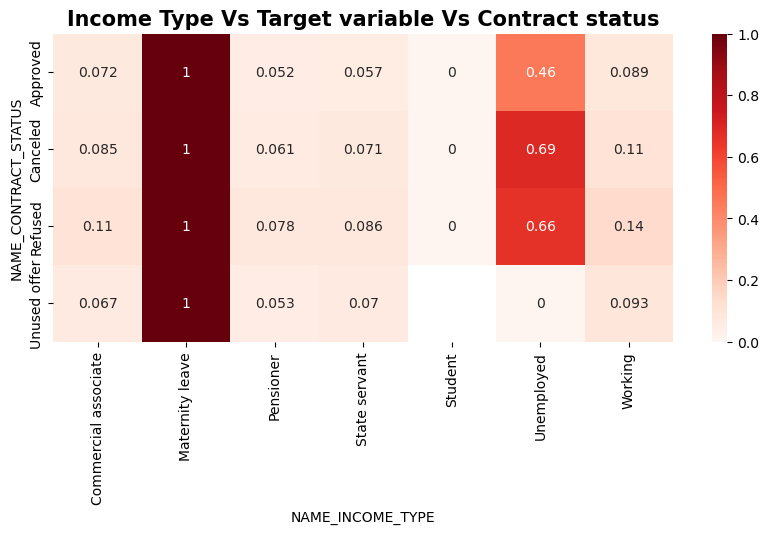

In [408]:
plt.figure(figsize=(10,4))
res=pd.pivot_table(data=merged_data, index="NAME_CONTRACT_STATUS", columns="NAME_INCOME_TYPE", values="TARGET")
sns.heatmap(res, annot= True, cmap="Reds")
plt.title('Income Type Vs Target variable Vs Contract status',fontsize = 15, fontweight='bold');
plt.show()

In [409]:
#observation: Maternity income type is having strong linear relationship with defaulter. Unemployed - approved loans is having medium correation with defaulter.

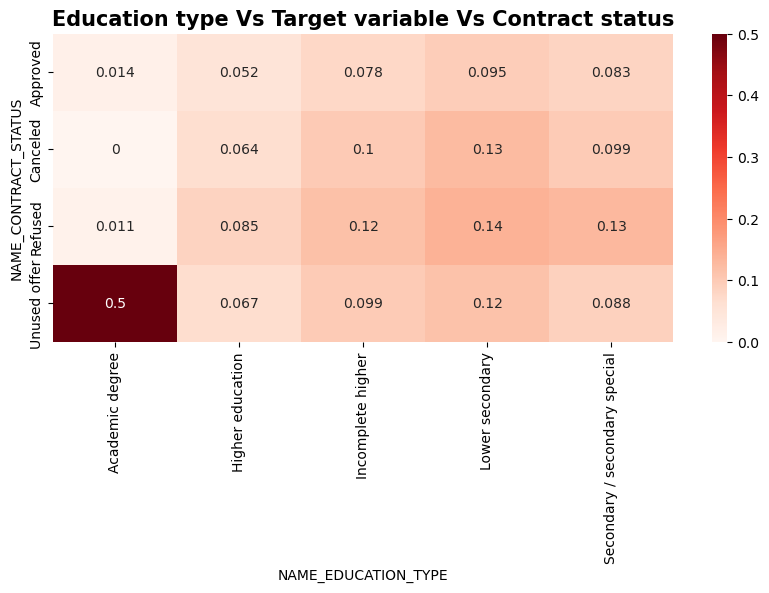

In [410]:
plt.figure(figsize=(10,4))
res=pd.pivot_table(data=merged_data, index="NAME_CONTRACT_STATUS", columns="NAME_EDUCATION_TYPE", values="TARGET")
sns.heatmap(res, annot= True, cmap="Reds")
plt.title('Education type Vs Target variable Vs Contract status',fontsize = 15, fontweight='bold');
plt.show()

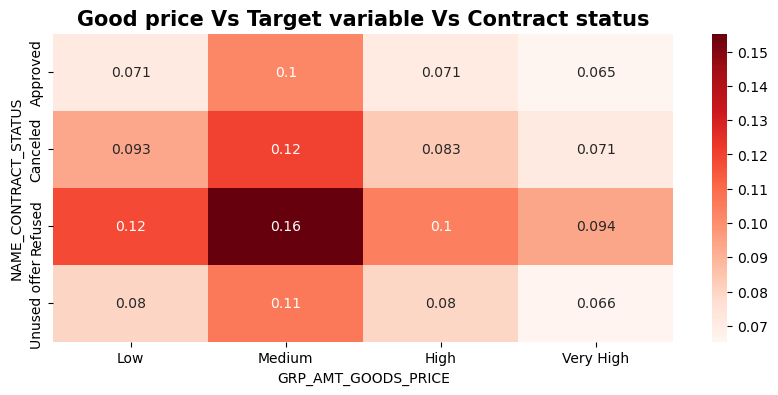

In [411]:
plt.figure(figsize=(10,4))
res=pd.pivot_table(data=merged_data, index="NAME_CONTRACT_STATUS", columns="GRP_AMT_GOODS_PRICE", values="TARGET")
sns.heatmap(res, annot= True, cmap="Reds")
plt.title('Good price Vs Target variable Vs Contract status',fontsize = 15, fontweight='bold');
plt.show()

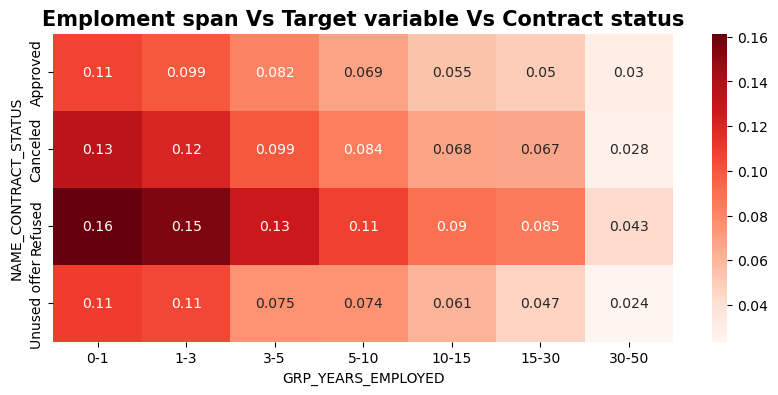

In [412]:
plt.figure(figsize=(10,4))
res=pd.pivot_table(data=merged_data, index="NAME_CONTRACT_STATUS", columns="GRP_YEARS_EMPLOYED", values="TARGET")
sns.heatmap(res, annot= True, cmap="Reds")
plt.title('Emploment span Vs Target variable Vs Contract status',fontsize = 15, fontweight='bold');
plt.show()

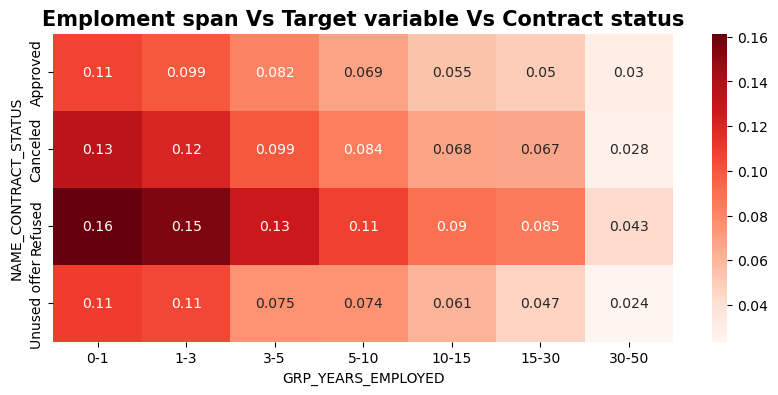

In [413]:
plt.figure(figsize=(10,4))
res=pd.pivot_table(data=merged_data, index="NAME_CONTRACT_STATUS", columns="GRP_YEARS_EMPLOYED", values="TARGET")
sns.heatmap(res, annot= True, cmap="Reds")
plt.title('Emploment span Vs Target variable Vs Contract status',fontsize = 15, fontweight='bold');
plt.show()

In [414]:
#TOP 10 Correlation for merged_data data frame.
corr_2 = merged_data.corr().abs().unstack().sort_values(ascending=False).drop_duplicates().dropna()
corr_2[0:11]

SK_ID_CURR                   SK_ID_CURR                  1.000000
YEARS_EMPLOYED               DAYS_EMPLOYED               1.000000
AMT_APPLICATION              AMT_GOODS_PRICE_y           0.999870
DAYS_EMPLOYED                FLAG_EMP_PHONE              0.999772
YEARS_EMPLOYED               FLAG_EMP_PHONE              0.999771
AGE                          DAYS_BIRTH                  0.999708
OBS_60_CNT_SOCIAL_CIRCLE     OBS_30_CNT_SOCIAL_CIRCLE    0.998566
AMT_GOODS_PRICE_y            AMT_CREDIT_y                0.993196
AMT_GOODS_PRICE_x            AMT_CREDIT_x                0.986342
AMT_APPLICATION              AMT_CREDIT_y                0.975715
REGION_RATING_CLIENT_W_CITY  REGION_RATING_CLIENT        0.945437
dtype: float64

# END